In [1]:
%matplotlib inline

import math, time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib import animation
import scipy.cluster as cluster
from tqdm.notebook import trange, tqdm
from IPython.display import HTML

matplotlib.rcParams['animation.embed_limit'] = 4000000

In [2]:
START_POINTS_PER_SENSORY_DIMENSION = 101
N_SENSORS = 2
MAX_ROLLOUT_STEPS = 20000
BUFFER_SIZE = 5
#REGULARIZATION = 10**-12
TAU = 20
KAPPA = 1.8
FIXED_POINT_TIME_THRESHOLD = 200
FIXED_POINT_ABS_TOLERANCE = 1e-3 # 1e-3 #> 6 # 1e-3 > 91 # 1e-4 > 200
FIXED_POINT_REL_TOLERANCE = 0.0 # 1e-2
ORTHOGONALITY_TOLERANCE = 1e-03
DET_IS_ONE_TOLERANCE = 1e-05
REGULARIZATION = 1e-7
LAST_N_TIMESTEPS_FOR_MEAN = 1000
TOL = 10*1e-2
MAX_CLUSTER_DISTANCE = 0.1

REPRODUCE_2018_ALGORTHM = False

VERBOSE = False
PLOT_TIMESTEPS = True
INTRO_TIMSTEPS = 500
PLOT_TRAJECTORY_LAST_N_X_VALUE = 100
C_PLOT_WIDTH = 20
PLOT_C_HAT_EVOLUTION = True
CYAN = [0,1,1,1]
RED = [1,0,0,1]
RENDER_ANIMATION = True

ROBOT_L1 = 0.5  # Link 1 length
ROBOT_L2 = 0.5  # Link 2 length
NUMBER_C_MATRIX_SAMPLES_PER_DIMENSION = 8
REACHED_TARGET_MIN_DISTANCE = 0.01

In [3]:
def lprint(*args, **kwargs):
    if VERBOSE:
        print(*args, **kwargs)

In [4]:
class Dep():
    
    def __init__(self, c_init, x_init):
        self.c = c_init
        self.x = x_init
        self.t = 0
        self.tau = TAU
        self.kappa = KAPPA
        self.model = np.identity(N_SENSORS)
        self.x_buffer = np.zeros(shape=(N_SENSORS, BUFFER_SIZE))
        for j in range(BUFFER_SIZE):
            self.x_buffer[:,j] = x_init[:,0]
        
    def step(self, x):
        self.x = x
        self.t_mod = self.t % BUFFER_SIZE
        lprint("\nt", self.t)
        lprint("\nt_mod", self.t_mod)
        self.x_buffer[:, self.t_mod] = self.x[:,0]
        #print("x", self.x)
        #print("x_buffer", self.x_buffer)
        self.change_c()
        self.normalize_c()
        self.calculate_y()
        self.t = self.t + 1
        #self.x = self.y # short circuit for x(t+1)
        return (self.c_hat, self.y)
        
    def change_c(self):
        x = self.x_buffer[:, self.t_mod]
        xx = self.x_buffer[:, self.t_mod - 1]
        xxx = self.x_buffer[:, self.t_mod - 2]
        lprint("x", x)
        lprint("xx", xx)
        lprint("xxx", xxx)
        x_dot_prime = np.array([x-xx])
        x_dot = np.array([xx-xxx])
        lprint("x_dot", x_dot)
        lprint("x_dot_prime", x_dot_prime) 
        y_dot_tilde = np.matmul(self.model, x_dot_prime.T)
        lprint("y_dot_tilde", y_dot_tilde)
        product = np.matmul(y_dot_tilde, x_dot)     
        lprint("product", product)
        lprint("previous c")
        lprint(self.c)
        lprint("product - self.c", product - self.c)
        lprint("(product - self.c) / self.tau", (product - self.c) / self.tau)
        self.c = self.c + ((product - self.c) / self.tau)
        lprint("updated c", self.c)
        
    def normalize_c(self):
        norml = math.sqrt(np.sum(self.c**2))
        lprint("norml", norml)
        self.c_hat = np.multiply(self.c, self.kappa/(norml+REGULARIZATION))
        lprint("c_hat", self.c_hat)
        
    def calculate_y(self):
        lprint("c_hat", self.c_hat)
        lprint("x", self.x)
        lprint("c_hat*x", np.matmul(self.c_hat, self.x))
        self.y = np.tanh(np.matmul(self.c_hat, self.x))
        lprint("y", self.y)
                

In [5]:
def get_angle_from_c_mean(c_mean):
    norm = np.linalg.norm(c_mean)
    if norm < TOL:
        # Zero matrix
        angle = -2000
    elif np.abs(c_mean[0,0]-c_mean[1,1])<TOL and np.abs(c_mean[1,0]+c_mean[0,1])<TOL:
        # Standard attractor, C interpreted as rotational matrix
        angle = np.arctan2(c_mean[1,0],c_mean[0,0]) * 180 / np.pi
        #angle = round(Decimal(angle,2))
        angle = round(angle,2)
    else:
        # period-2 oscillator
        angle = -1000
    return angle    
            
def angle_to_rgba(angle):
        norm = matplotlib.colors.Normalize(vmin=-90, vmax=90, clip=True)
        mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral)
        if angle==-1000:
            return CYAN
        elif angle ==-2000:
            return RED
        return list(mapper.to_rgba(angle))   


In [6]:
x = np.array([[-1, 1]]).T
print(x.T)
c = np.identity(len(x))
dep = Dep(c, x)
for t in range(8):
    print("------- t=%d" % t)
    print("x",x.flatten())
    c_hat, y = dep.step(x)
    dep_x = dep.x_buffer[:, dep.t_mod]
    dep_xx = dep.x_buffer[:, dep.t_mod - 1]
    dep_xxx = dep.x_buffer[:, dep.t_mod - 2]
    x_dot_prime = np.array([dep_x-dep_xx])
    x_dot = np.array([dep_xx-dep_xxx])
    print("x_dot (x-xx)", x_dot)
    print("x_dot_prime (xx-xxx)", x_dot_prime)
    print("t_mod", dep.t_mod)
    print("x_buffer", dep.x_buffer)
    print("y",y.flatten())
    #print(c_hat) 
    x = y

[[-1  1]]
------- t=0
x [-1  1]
x_dot (x-xx) [[0. 0.]]
x_dot_prime (xx-xxx) [[0. 0.]]
t_mod 0
x_buffer [[-1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1.  1.]]
y [-0.8545526  0.8545526]
------- t=1
x [-0.8545526  0.8545526]
x_dot (x-xx) [[0. 0.]]
x_dot_prime (xx-xxx) [[ 0.1454474 -0.1454474]]
t_mod 1
x_buffer [[-1.        -0.8545526 -1.        -1.        -1.       ]
 [ 1.         0.8545526  1.         1.         1.       ]]
y [-0.79602534  0.79602534]
------- t=2
x [-0.79602534  0.79602534]
x_dot (x-xx) [[ 0.1454474 -0.1454474]]
x_dot_prime (xx-xxx) [[ 0.05852725 -0.05852725]]
t_mod 2
x_buffer [[-1.         -0.8545526  -0.79602534 -1.         -1.        ]
 [ 1.          0.8545526   0.79602534  1.          1.        ]]
y [-0.76727873  0.76727873]
------- t=3
x [-0.76727873  0.76727873]
x_dot (x-xx) [[ 0.05852725 -0.05852725]]
x_dot_prime (xx-xxx) [[ 0.02874661 -0.02874661]]
t_mod 3
x_buffer [[-1.         -0.8545526  -0.79602534 -0.76727873 -1.        ]
 [ 1.          0.8545526   0.79602534  0.767

In [7]:
def rollout_dep(x1, x2, c=None):
    x = np.array([[x1, x2]]).T
    if c is None:
        c = np.identity(len(x))
    all_c_hat = []
    all_x = []
    dep = Dep(c, x)
    for t in range(MAX_ROLLOUT_STEPS):
        c_hat, y = dep.step(x)
        all_c_hat.append(c_hat)
        x = y # Short circuit
        all_x.append(x) 
    all_c_hat = np.array(all_c_hat)
    c_mean = np.mean(all_c_hat[-LAST_N_TIMESTEPS_FOR_MEAN:], axis=0)
    return (c_mean, all_c_hat, all_x)

In [8]:
def plot_c(all_c_hat):
    height = int(math.ceil(len(all_c_hat) / C_PLOT_WIDTH))
    print(height)
    fig, axes = plt.subplots(height, C_PLOT_WIDTH, figsize=(16, height*1))
    for t in tqdm(range(height*C_PLOT_WIDTH), leave=False):
        ax = axes[t] if height==1 else axes[t // C_PLOT_WIDTH, t % C_PLOT_WIDTH]
        ax.set_axis_off()
        if t<len(all_c_hat):
            c_hat = all_c_hat[t]
            lprint("t", t)
            lprint("c_hat", c_hat)
            ax.set_title("t=%d" % t)
            matrix = ax.imshow(c_hat)
            matrix.set_cmap("PRGn")
    plt.show()
    #plt.close()    
    
def plot_c_timeseries(all_c_hat):
    fig, ax = plt.subplots(figsize=(16, 4))
    c_hats = np.array(all_c_hat)
    flat_c_hats = np.array([c_hats[i].flatten() for i in range(len(c_hats))])
    ax.plot(flat_c_hats, label=['c_hat1','c_hat2','c_hat3','c_hat4'])
    ax.legend()
    plt.show()
    


In [9]:
def print_initial_values(c_matrix0, x1, x2):
    print("--------------------------------------------------------------------------------------------------------")
    print("Initial conditions: x1=%.1f x2=%.1f c=%s kappa=%.1f tau=%.1f x_dot=[0.0 0.0] y_dot=[0.0 0.0]" % (x1, x2, c_matrix0.flatten(), KAPPA, TAU))
    print("--------------------------------------------------------------------------------------------------------")
    
def print_other_initial_values():
    print("--------------------------------------------------------------------------------------------------------")
    print("Other initial conditions: kappa=%.1f tau=%.1f x_dot=[0.0 0.0] y_dot=[0.0 0.0]" % (KAPPA, TAU))
    print("--------------------------------------------------------------------------------------------------------")    

In [10]:
def plot_trajectory_dep_and_robot(all_rx, all_ry, all_x, initial_ee, target_ee, ns, ys):
    fig, axes = plt.subplots(1,3, figsize=(16,4.5))
    fig.suptitle("Initial EE pos: %s   Target EE pos: %s" % (str(initial_ee), str(target_ee)), fontsize=14)
    # Search graph
    ax = axes[0]
    ax.plot(ns, ys)
    ax.set_title("Search for C_matrices that reach target")
    ax.set_xlabel("Search steps")
    ax.set_ylabel("Distance from target")    
    intro_len = len(all_rx)-PLOT_TRAJECTORY_LAST_N_X_VALUE
    # Left hand DEP graph
    ax = axes[1]
    ax.set_title("DEP space")
    selected_x = all_x[:intro_len]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, color = 'paleturquoise', marker='o', markevery=[0])    
    selected_x = all_x[:intro_len]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, color = 'paleturquoise')    
    selected_x = all_x[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, marker='o', markevery=[-1])
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    ax.set_aspect(1)
    # Right hand robot graph
    ax = axes[2]
    ax.set_title("Robot space")
    selected_rx = all_rx[:intro_len]
    selected_ry = all_ry[:intro_len]
    ax.plot(selected_rx, selected_ry, color = 'paleturquoise', marker='o', markevery=[0])    
    selected_rx = all_rx[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    selected_ry = all_ry[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    ax.plot(selected_rx, selected_ry, marker='o', markevery=[-1])
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlabel("End effector X")
    ax.set_ylabel("End effector y")
    ax.set_aspect(1)
    c = plt.Circle((0., 0.), radius=1, color='red', alpha=.3)
    ax.add_artist(c)
    ax.plot(target_ee[0], target_ee[1], color='red', marker='o')
    ax.plot(initial_ee[0], initial_ee[1], color='green', marker='o')
    plt.show()

def plot_robot_trajectory_with_intro(all_rx, all_ry):
    fig, ax = plt.subplots()
    selected_rx = all_rx[:INTRO_TIMSTEPS]
    selected_ry = all_ry[:INTRO_TIMSTEPS]
    ax.plot(selected_rx, selected_ry, color = 'paleturquoise', marker='o', markevery=[0])    
    selected_rx = all_rx[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    selected_ry = all_ry[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    ax.plot(selected_rx, selected_ry, marker='o', markevery=[-1])
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlabel("End effector X")
    ax.set_ylabel("End effector y")
    ax.set_aspect(1)
    c = plt.Circle((0., 0.), radius=1, color='red', alpha=.3)
    ax.add_artist(c)
    plt.show()


In [11]:
def plot_trajectory(all_x):
    fig, ax = plt.subplots()
    selected_x = all_x[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2)
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    plt.show()

def plot_trajectory_with_intro(all_x):
    fig, ax = plt.subplots()
    selected_x = all_x[:INTRO_TIMSTEPS]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, color = 'paleturquoise', marker='o', markevery=[0])    
    selected_x = all_x[:INTRO_TIMSTEPS]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, color = 'paleturquoise')    
    selected_x = all_x[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, marker='o', markevery=[-1])
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    plt.show()
    
def subplot_trajectory_with_intro(ax, all_x):
    selected_x = all_x[:INTRO_TIMSTEPS]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, color = 'paleturquoise', marker='o', markevery=[0])    
    selected_x = all_x[-PLOT_TRAJECTORY_LAST_N_X_VALUE:]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    ax.plot(x1, x2, marker='o', markevery=[-1])
    ax.grid()
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_xticks([])
    ax.set_yticks([])
    #ax.set_xlabel("x1")
    #ax.set_ylabel("x2")
    

In [12]:
def dep_to_robot(x):
    x1, x2 = x[0], x[1]
    theta1 = np.pi*x1
    theta2 = np.pi*x2
    j1x = ROBOT_L1*np.cos(theta1)
    j1y = ROBOT_L1*np.sin(theta1)
    j2x = j1x + ROBOT_L2*np.cos(theta1+theta2)     
    j2y = j1y + ROBOT_L2*np.sin(theta1+theta2)               
    return (j1x, j1y, j2x, j2y)

def robot_to_dep(j2x, j2y):
    theta2 = np.arccos((j2x*j2x + j2y*j2y - ROBOT_L1*ROBOT_L1 - ROBOT_L2*ROBOT_L2)/(2*ROBOT_L1*ROBOT_L2))
    theta1 = np.arctan2(j2y, j2x) - np.arctan(ROBOT_L2*np.sin(theta2)/ (ROBOT_L1 + ROBOT_L2*np.cos(theta2)))
    x2 = theta2/np.pi
    x1 = theta1/np.pi
    return (x1, x2)

def dep_to_ee(x):
    _, _, rx, ry = dep_to_robot(x)
    ee = [rx, ry]
    return np.array(ee)

def ee_to_dep(ee):
    x = list(robot_to_dep(ee[0], ee[1])) 
    return np.array(x)

In [13]:
ee = dep_to_ee([0.9,-0.25])
print("ee",ee)
x2 = ee_to_dep(ee)
print("x2", x2)
ee2 = dep_to_ee(x2)
print("ee2",ee2)

ee [-0.70252351  0.60001176]
x2 [0.65 0.25]
ee2 [-0.70252351  0.60001176]


In [14]:
# Thank you https://colab.research.google.com/github/jckantor/CBE30338/blob/master/docs/A.03-Animation-in-Jupyter-Notebooks.ipynb?pli=1#scrollTo=Nnb7GiT110kZ

def setup_backdrop():
    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    ax1 = axes[0]
    ax2 = axes[1]
    # Phase spaxce
    ax1.grid()
    ax1.set_xlim(-1, 1)
    ax1.set_ylim(-1, 1)
    ax1.set_xlabel("x1")
    ax1.set_ylabel("x2")
    ax1.set_aspect(1)
    phase_title = ax1.set_title('')
    line1, = ax1.plot([], [], 'b', lw=1, marker='o', markevery=[-1]) # 2
    # Robot Space
    ax2.grid()
    ax2.set_xlim(-1, 1)
    ax2.set_ylim(-1, 1)
    ax2.set_xlabel("rx")
    ax2.set_ylabel("ry")
    ax2.set_aspect(1)
    ticks = [-1., -.75, -.5, -.25, 0., .25, .5, .75, 1.]
    ax2.set_xticks(ticks, minor=False)
    ax2.set_yticks(ticks, minor=False)
    ax2.xaxis.grid(True, which='major')
    ax2.yaxis.grid(True, which='major')
    robot_title = ax2.set_title('')
    arm_thickness = 3
    arm1, = ax2.plot([], [], 'g', lw=arm_thickness, marker='o', markevery=[-1])
    arm2, = ax2.plot([], [], 'g', lw=arm_thickness, marker='o', markevery=[-1])
    start, = ax2.plot([], [], color='green', marker='o')
    target, = ax2.plot([], [], color='red', marker='o')
    return (fig, ax1, ax2, phase_title, line1, robot_title, arm1, arm2, start, target)
    
def draw_phase_and_robot(n, all_x, line1, phase_title, arm1, arm2, l1, l2, start, target, initial_ee, target_ee):
    selected_x = all_x[:(n+1)]
    x1 = list(map(lambda x: x[0], selected_x))
    x2 = list(map(lambda x: x[1], selected_x))
    # Phase space
    line1.set_data(x1, x2)
    phase_title.set_text("t = %d" % n)
    # Robot space
    theta1 = np.pi*x1[-1]
    j1x = l1*np.cos(theta1)
    j1y = l1*np.sin(theta1)
    arm1_coords = [[0., j1x], [0., j1y]]
    arm1.set_data(arm1_coords)
    theta2 = np.pi*x2[-1]
    j2x = j1x + l2*np.cos(theta1+theta2)     
    j2y = j1y + l2*np.sin(theta1+theta2)   
    #j1x, j1y, j2x, j2y = dep_to_robot(all_x[-1])
    arm2_coords = [[j1x, j2x], [j1y, j2y]]
    arm2.set_data(arm2_coords)
    start.set_data([initial_ee[0], initial_ee[1]])
    target.set_data([target_ee[0], target_ee[1]])
    return line1,
    
def render_animation(all_x, initial_ee, target_ee):
    l1, l2 = 0.5, 0.5
    fig, ax1, ax2, phase_title, line1, robot_title, arm1, arm2, start, target = setup_backdrop()
    def drawframe(n):
        return draw_phase_and_robot(n, all_x, line1, phase_title, arm1, arm2, l1, l2, start, target, initial_ee, target_ee)
    start_time = time.time()
    anim = animation.FuncAnimation(fig, drawframe, frames=len(all_x), interval=100, blit=True)
    html = HTML(anim.to_html5_video())
    print("Rendering took %ds" % (time.time()-start_time))
    display(html)
    plt.close()
    #return html

In [15]:
def distance_to_target(initial_ee, target_ee, c, n, n_distance):
    initial_x = ee_to_dep(initial_ee)
    target_x = ee_to_dep(target_ee)
    best_distance = 1e6
    x = np.array([initial_x]).T
    initial_c = c.reshape((2, 2))
    dep = Dep(initial_c, x)
    all_rx, all_ry, all_x = [initial_ee[0]], [initial_ee[1]], [initial_x]
    ee = initial_ee
    for t in range(MAX_ROLLOUT_STEPS):
        distance_to_target = np.linalg.norm(ee-target_ee)
        for e, eps in enumerate(EPSILONS):
            if (n_distance[e]==0) and (distance_to_target < eps):
                n_distance[e]=n                    
        if distance_to_target < best_distance:
            best_distance = distance_to_target
        _, x = dep.step(x) # Short circuit
        xf = x.T.squeeze()
        ee = dep_to_ee(xf)
        all_rx.append(ee[0])
        all_ry.append(ee[1])
        all_x.append(xf)
        if distance_to_target < REACHED_TARGET_MIN_DISTANCE:
            break
    #print("n_distance", n_distance)
    return (distance_to_target < REACHED_TARGET_MIN_DISTANCE, best_distance, np.array(all_rx), np.array(all_ry), np.array(all_x), n_distance)    

VISITED_DIVISIONS = 2
EPSILONS = [0.01, 0.025, 0.05, 0.075, 0.1]

def search_for_c_matrix(initial_ee, target_ee):
    print("Searching for c_matrix. Initial EE:", initial_ee)
    start_time = time.time()
    options = np.linspace(-1., 1., NUMBER_C_MATRIX_SAMPLES_PER_DIMENSION)    
    target_reached = False
    closest_distance = 1e6
    n = 0
    ns, ys  = [], []
    best_c, best_all_rx, best_all_ry = None, None, None
    all_n_distances = []
    n_distance = [0] * len(EPSILONS)
    for p0 in options:
        for p1 in options:
            for p2 in options:
                for p3 in options:
                    c_matrix = np.array([p0, p1, p2, p3])                                   
                    success, distance, all_rx, all_ry, all_x, n_distance = distance_to_target(initial_ee, target_ee, c_matrix, n, n_distance)
                    #print("n, c, success, distance, closest", n, c_matrix, success, distance, closest_distance)
                    if distance < closest_distance:
                        closest_distance = distance
                        best_c = c_matrix
                        best_all_rx = all_rx
                        best_all_ry = all_ry
                        best_all_x = all_x
                        ns.append(n)
                        ys.append(distance)
                    if success:
                        target_reached = True
                        print("C=%s reached target!" % str(c_matrix))
                        break
                    #render_animation(all_x)
                    #plot_trajectory_with_intro(all_x)
                    #plot_robot_trajectory_with_intro(all_rx, all_ry)
                    #ix = (np.floor(((all_rx + 1.0) /2.0)* VISITED_DIVISIONS) // VISITED_DIVISIONS).astype(int)
                    #visited_x[ix] = 1
                    #iy = (np.floor(((all_ry + 1.0) /2.0)* VISITED_DIVISIONS) // VISITED_DIVISIONS).astype(int)
                    #visited_y[iy] = 1
                    all_n_distances.append(n_distance)
                    n = n + 1
                if target_reached:
                    break
            if target_reached:
                break
        if target_reached:
            break
    if target_reached:                
        print("SUCCESS!!!")
    else:
        print("No solution found.")
    print("Best solution was %s, found in %d search steps, which reached distance %.3f in %d timesteps." % (str(best_c), n, closest_distance, len(best_all_x)))
    print("Took %ds" % int(time.time()-start_time))
    #for rx, ry in zip(best_all_rx[0:5], best_all_ry[0:5]):
    #    print("rx",rx,"ry",ry)
    plot_trajectory_dep_and_robot(best_all_rx[:-1], best_all_ry[:-1], best_all_x[:-1], initial_ee, target_ee, ns, ys)
    render_animation(best_all_x[:-1], initial_ee, target_ee)
    return target_reached, n, closest_distance, best_c, all_n_distances
                        



[-0.44840112 -0.88003676]
TEST 0: From EE [-0.44840112 -0.88003676] to [ 0.03978996 -0.05835178]
X1,X2: [-0.6, -0.1] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.787  0.955]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.         -0.71428571  0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -0.71428571  0.42857143 -0.71428571], found in 105 search steps, which reached distance 0.008 in 107 timesteps.
Took 163s


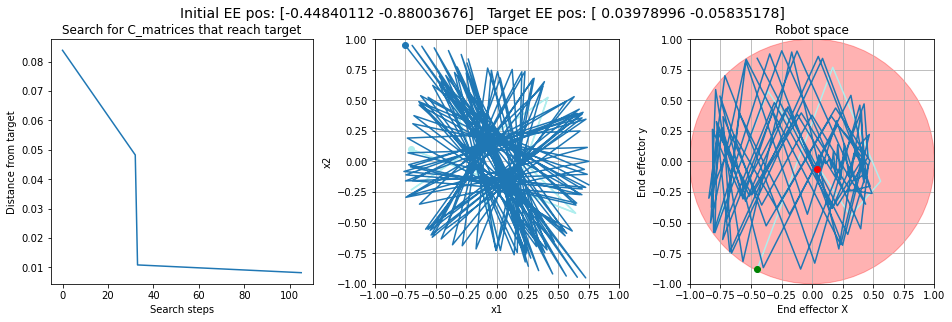

Rendering took 11s




[-0.44840112 -0.88003676]
TEST 1: From EE [-0.44840112 -0.88003676] to [ 0.59520723 -0.09618933]
X1,X2: [-0.6, -0.1] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.345  0.588]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.         -0.42857143  0.71428571 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.71428571 -0.14285714], found in 179 search steps, which reached distance 0.009 in 6 timesteps.
Took 241s


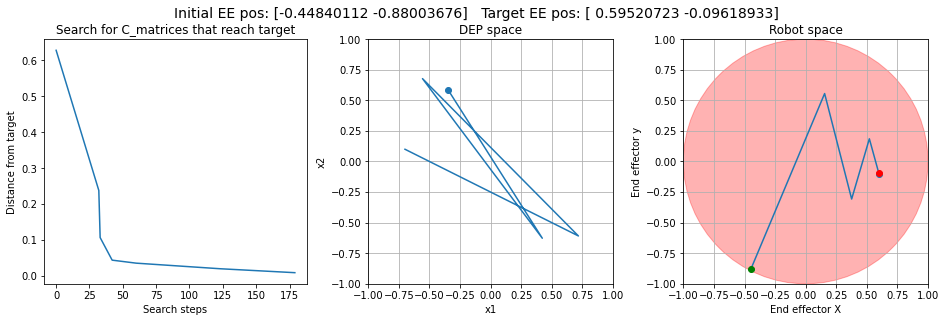

Rendering took 0s




[-0.44840112 -0.88003676]
TEST 2: From EE [-0.44840112 -0.88003676] to [ 0.18184562 -0.16287453]
X1,X2: [-0.6, -0.1] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.654  0.843]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-0.71428571 -0.14285714  1.         -0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.14285714  1.         -0.71428571], found in 761 search steps, which reached distance 0.010 in 5 timesteps.
Took 990s


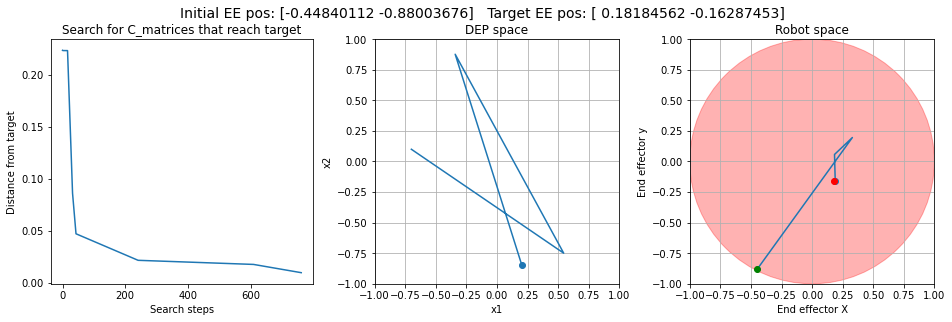

Rendering took 0s




[-0.44840112 -0.88003676]
TEST 3: From EE [-0.44840112 -0.88003676] to [-0.16850247 -0.24462343]
X1,X2: [-0.6, -0.1] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-1.096  0.808]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.         -1.         -1.         -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -1.         -1.         -0.42857143], found in 2 search steps, which reached distance 0.004 in 5 timesteps.
Took 2s


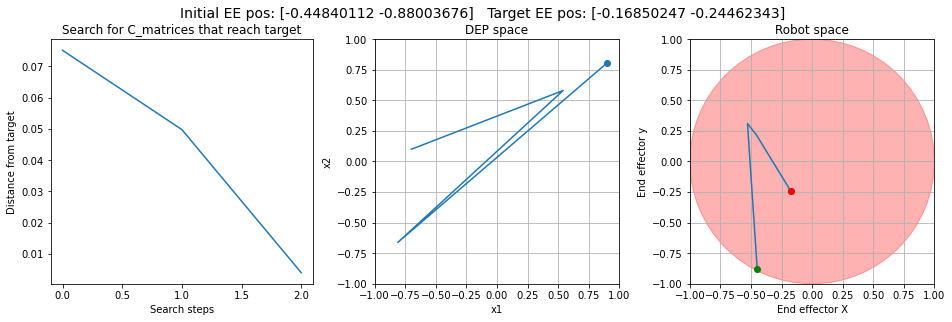

Rendering took 0s




[-0.44840112 -0.88003676]
TEST 4: From EE [-0.44840112 -0.88003676] to [0.5040396 0.2948911]
X1,X2: [-0.6, -0.1] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.133  0.603]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.         -1.          0.42857143 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -0.14285714], found in 43 search steps, which reached distance 0.010 in 40 timesteps.
Took 57s


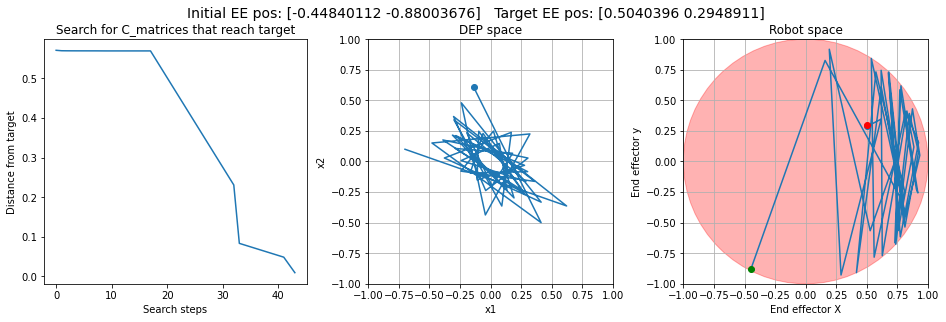

Rendering took 4s




[-0.44840112 -0.88003676]
TEST 5: From EE [-0.44840112 -0.88003676] to [-0.51590981  0.65867415]
X1,X2: [-0.6, -0.1] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-0.7  0.1] [0.527 0.369]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-0.71428571  0.71428571 -0.14285714  1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571  0.71428571 -0.14285714  1.        ], found in 927 search steps, which reached distance 0.007 in 19 timesteps.
Took 1191s


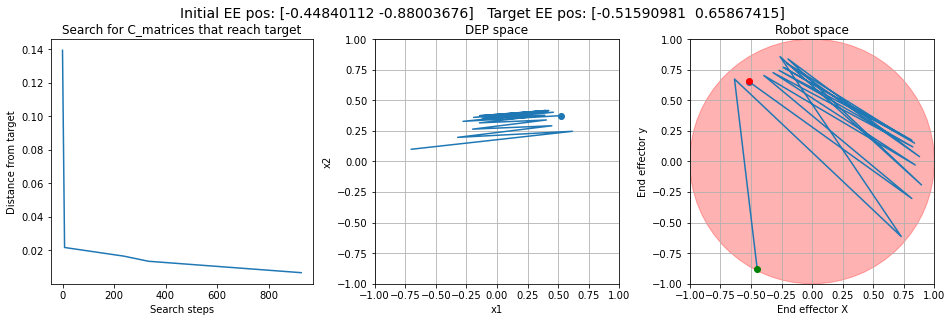

Rendering took 2s




[-0.44840112 -0.88003676]
TEST 6: From EE [-0.44840112 -0.88003676] to [-0.0234719  -0.99599384]
X1,X2: [-0.6, -0.1] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.535  0.055]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.          0.14285714 -1.          1.        ] reached target!
SUCCESS!!!
Best solution was [-1.          0.14285714 -1.          1.        ], found in 263 search steps, which reached distance 0.009 in 6 timesteps.
Took 344s


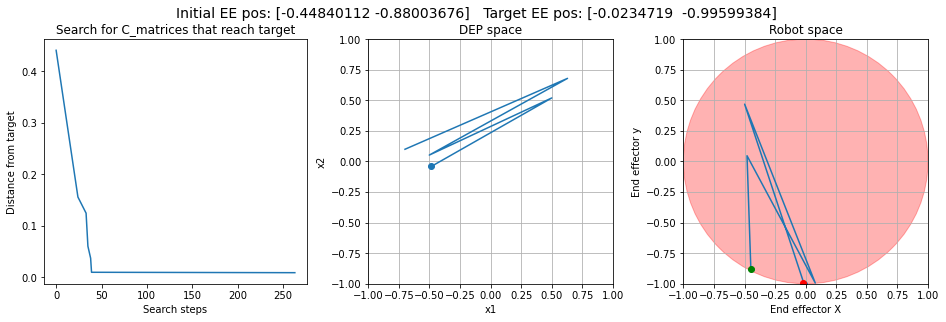

Rendering took 0s




[-0.44840112 -0.88003676]
TEST 7: From EE [-0.44840112 -0.88003676] to [0.06133806 0.31351151]
X1,X2: [-0.6, -0.1] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-0.7  0.1] [0.042 0.793]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-0.42857143 -1.          1.          0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.42857143 -1.          1.          0.71428571], found in 1086 search steps, which reached distance 0.004 in 93 timesteps.
Took 1407s


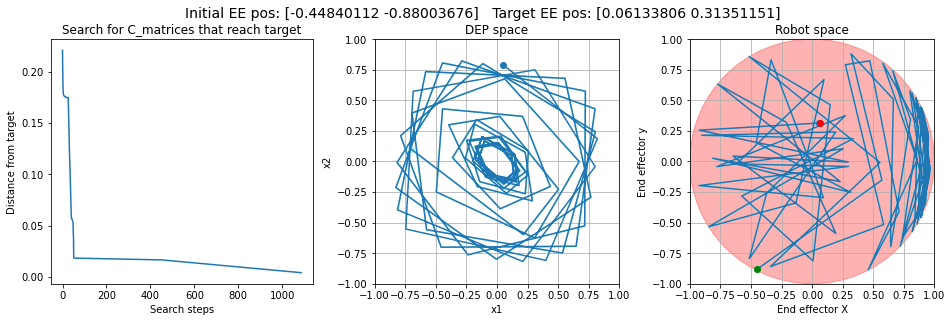

Rendering took 10s




[-0.44840112 -0.88003676]
TEST 8: From EE [-0.44840112 -0.88003676] to [0.08924421 0.11103709]
X1,X2: [-0.6, -0.1] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.17   0.909]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-1.          0.14285714  0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.          0.14285714  0.71428571 -1.        ], found in 304 search steps, which reached distance 0.007 in 5 timesteps.
Took 398s


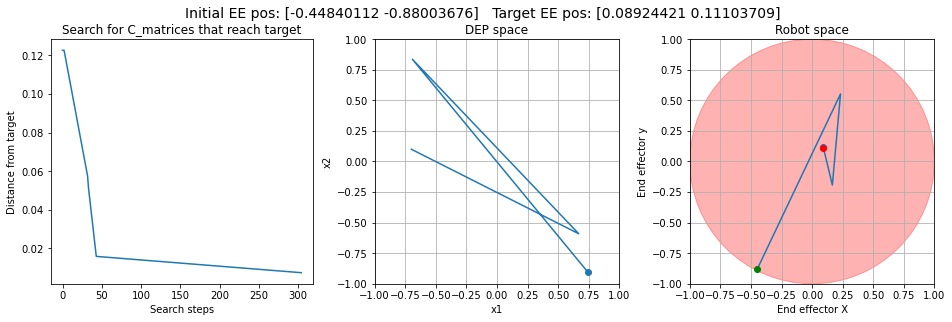

Rendering took 0s




[-0.44840112 -0.88003676]
TEST 9: From EE [-0.44840112 -0.88003676] to [-0.2800086  -0.91529548]
X1,X2: [-0.6, -0.1] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-0.7  0.1] [-0.688  0.187]
Searching for c_matrix. Initial EE: [-0.44840112 -0.88003676]
C=[-0.71428571 -0.42857143  0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.42857143  0.42857143 -0.71428571], found in 681 search steps, which reached distance 0.003 in 16 timesteps.
Took 885s


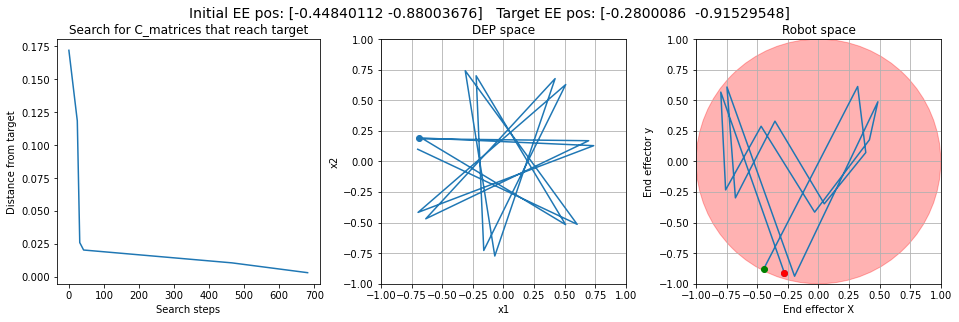

Rendering took 1s




[-0.13938413 -0.07101976]
TEST 10: From EE [-0.13938413 -0.07101976] to [ 0.03978996 -0.05835178]
X1,X2: [0.7, 0.9] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.787  0.955]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.         -1.          0.14285714 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.14285714 -0.42857143], found in 34 search steps, which reached distance 0.004 in 44 timesteps.
Took 43s


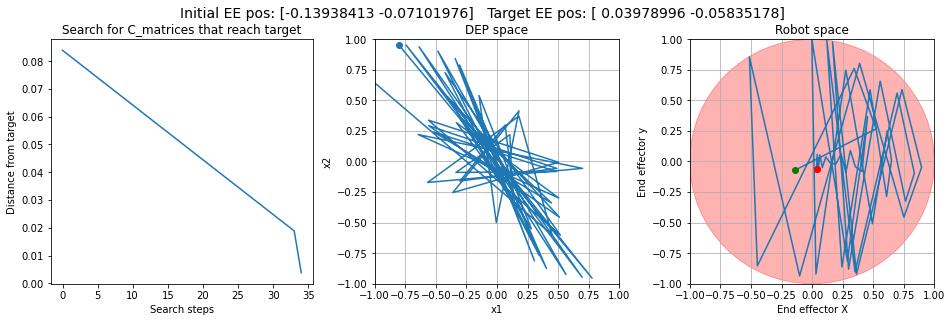

Rendering took 4s




[-0.13938413 -0.07101976]
TEST 11: From EE [-0.13938413 -0.07101976] to [ 0.59520723 -0.09618933]
X1,X2: [0.7, 0.9] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.345  0.588]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-0.42857143  0.71428571 -0.14285714 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-0.42857143  0.71428571 -0.14285714 -0.14285714], found in 1435 search steps, which reached distance 0.007 in 64 timesteps.
Took 1839s


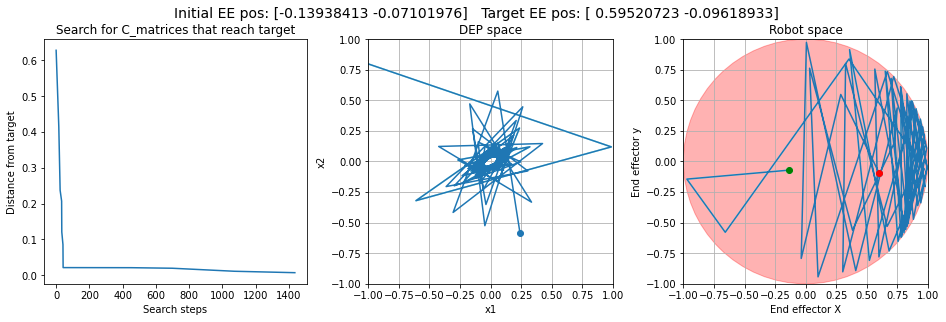

Rendering took 6s




[-0.13938413 -0.07101976]
TEST 12: From EE [-0.13938413 -0.07101976] to [ 0.18184562 -0.16287453]
X1,X2: [0.7, 0.9] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.654  0.843]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-0.71428571 -0.71428571  0.14285714 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.71428571  0.14285714 -0.42857143], found in 610 search steps, which reached distance 0.009 in 71 timesteps.
Took 797s


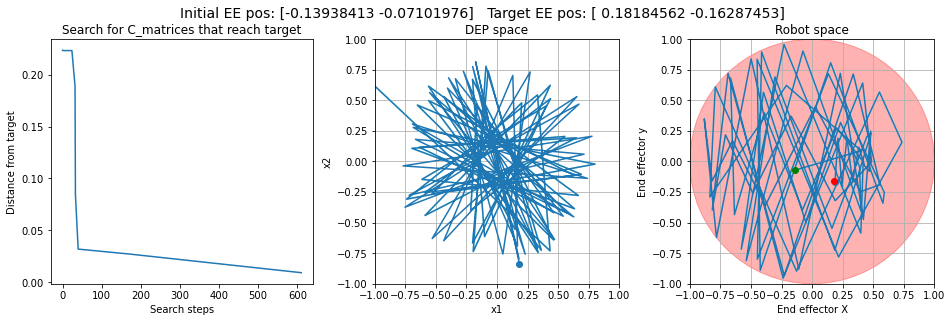

Rendering took 7s




[-0.13938413 -0.07101976]
TEST 13: From EE [-0.13938413 -0.07101976] to [-0.16850247 -0.24462343]
X1,X2: [0.7, 0.9] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-1.096  0.808]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.          0.42857143 -1.          0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.          0.42857143 -1.          0.71428571], found in 326 search steps, which reached distance 0.004 in 19 timesteps.
Took 413s


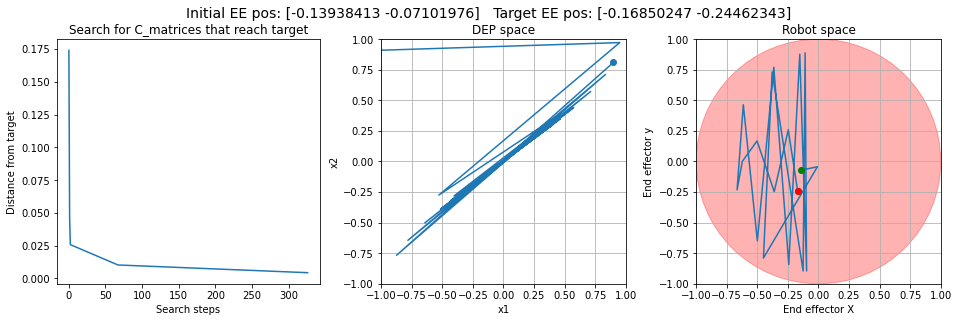

Rendering took 2s




[-0.13938413 -0.07101976]
TEST 14: From EE [-0.13938413 -0.07101976] to [0.5040396 0.2948911]
X1,X2: [0.7, 0.9] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.133  0.603]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.          0.71428571 -0.42857143 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.          0.71428571 -0.42857143 -0.14285714], found in 403 search steps, which reached distance 0.008 in 41 timesteps.
Took 522s


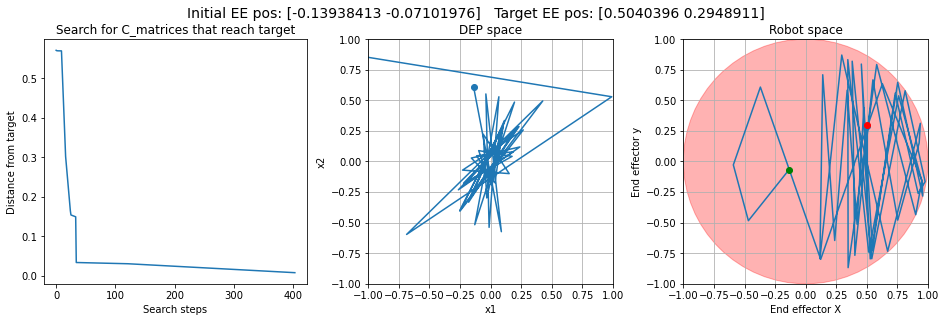

Rendering took 4s




[-0.13938413 -0.07101976]
TEST 15: From EE [-0.13938413 -0.07101976] to [-0.51590981  0.65867415]
X1,X2: [0.7, 0.9] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-1.3  0.9] [0.527 0.369]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-0.71428571 -0.71428571  0.14285714  0.14285714] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.71428571  0.14285714  0.14285714], found in 612 search steps, which reached distance 0.004 in 15 timesteps.
Took 790s


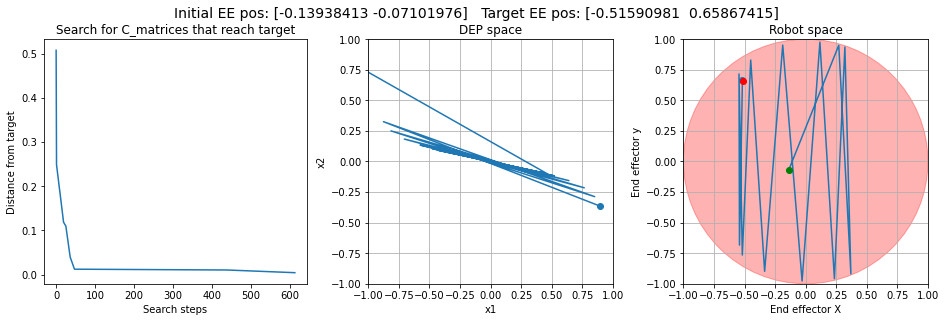

Rendering took 1s




[-0.13938413 -0.07101976]
TEST 16: From EE [-0.13938413 -0.07101976] to [-0.0234719  -0.99599384]
X1,X2: [0.7, 0.9] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.535  0.055]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.          0.71428571 -0.42857143  0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.          0.71428571 -0.42857143  0.42857143], found in 405 search steps, which reached distance 0.006 in 4 timesteps.
Took 543s


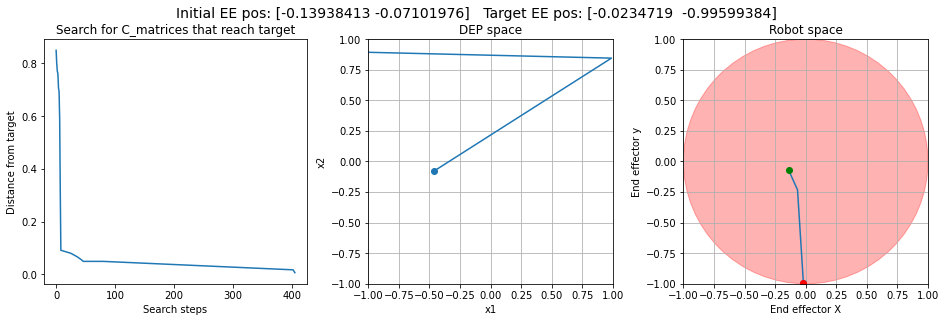

Rendering took 0s




[-0.13938413 -0.07101976]
TEST 17: From EE [-0.13938413 -0.07101976] to [0.06133806 0.31351151]
X1,X2: [0.7, 0.9] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-1.3  0.9] [0.042 0.793]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.         -1.          1.         -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          1.         -0.71428571], found in 57 search steps, which reached distance 0.007 in 7 timesteps.
Took 76s


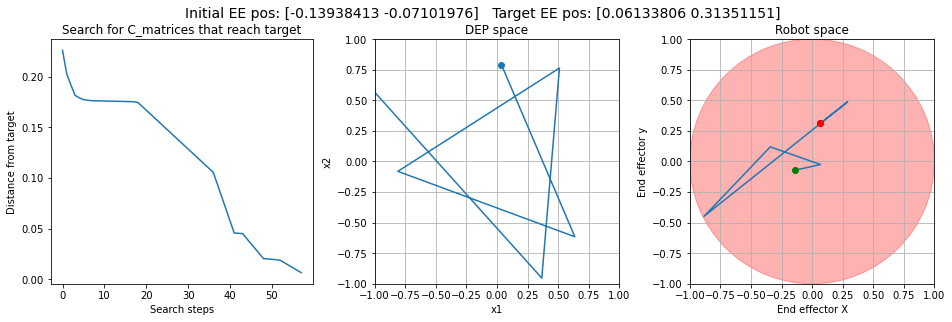

Rendering took 0s




[-0.13938413 -0.07101976]
TEST 18: From EE [-0.13938413 -0.07101976] to [0.08924421 0.11103709]
X1,X2: [0.7, 0.9] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.17   0.909]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.         -1.          0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -0.71428571], found in 41 search steps, which reached distance 0.009 in 222 timesteps.
Took 54s


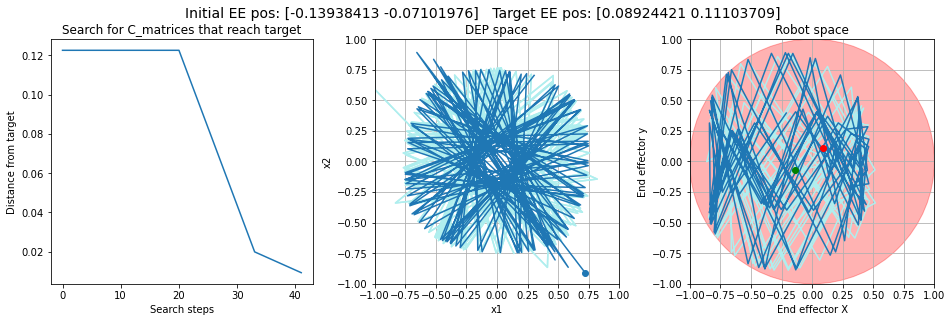

Rendering took 25s




[-0.13938413 -0.07101976]
TEST 19: From EE [-0.13938413 -0.07101976] to [-0.2800086  -0.91529548]
X1,X2: [0.7, 0.9] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-1.3  0.9] [-0.688  0.187]
Searching for c_matrix. Initial EE: [-0.13938413 -0.07101976]
C=[-1.         -1.          0.42857143 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -1.        ], found in 40 search steps, which reached distance 0.006 in 50 timesteps.
Took 52s


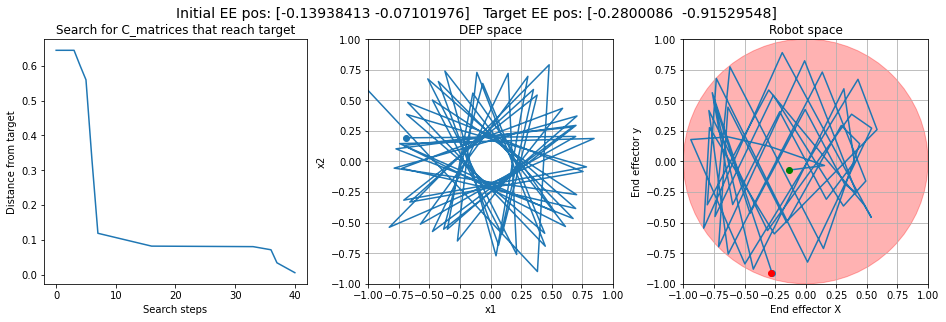

Rendering took 5s




[ 0.63003676 -0.63003676]
TEST 20: From EE [ 0.63003676 -0.63003676] to [ 0.03978996 -0.05835178]
X1,X2: [-0.4, 0.3] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.787  0.955]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-1.         -1.          0.42857143 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -0.14285714], found in 43 search steps, which reached distance 0.006 in 104 timesteps.
Took 56s


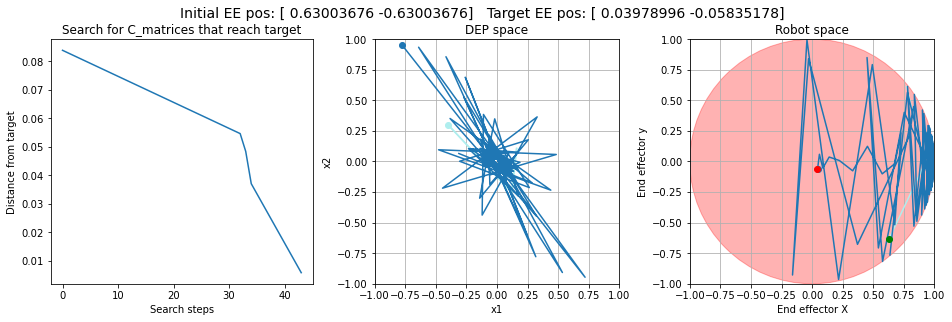

Rendering took 10s




[ 0.63003676 -0.63003676]
TEST 21: From EE [ 0.63003676 -0.63003676] to [ 0.59520723 -0.09618933]
X1,X2: [-0.4, 0.3] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.345  0.588]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-0.42857143  0.42857143 -0.71428571 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.42857143  0.42857143 -0.71428571 -0.42857143], found in 1354 search steps, which reached distance 0.008 in 5 timesteps.
Took 1779s


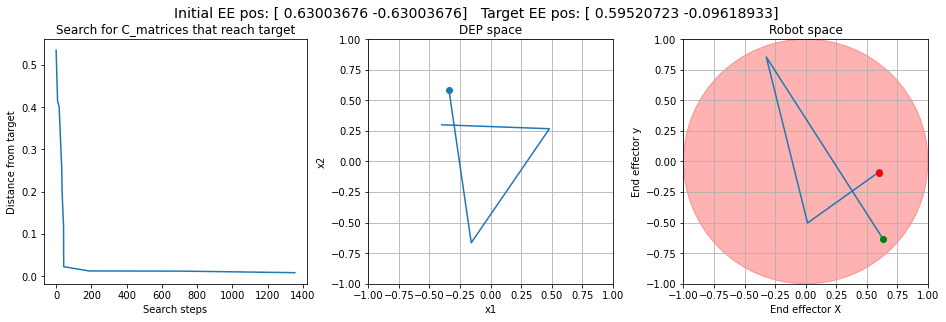

Rendering took 0s




[ 0.63003676 -0.63003676]
TEST 22: From EE [ 0.63003676 -0.63003676] to [ 0.18184562 -0.16287453]
X1,X2: [-0.4, 0.3] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.654  0.843]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-0.14285714 -1.         -0.71428571  1.        ] reached target!
SUCCESS!!!
Best solution was [-0.14285714 -1.         -0.71428571  1.        ], found in 1551 search steps, which reached distance 0.008 in 559 timesteps.
Took 2079s


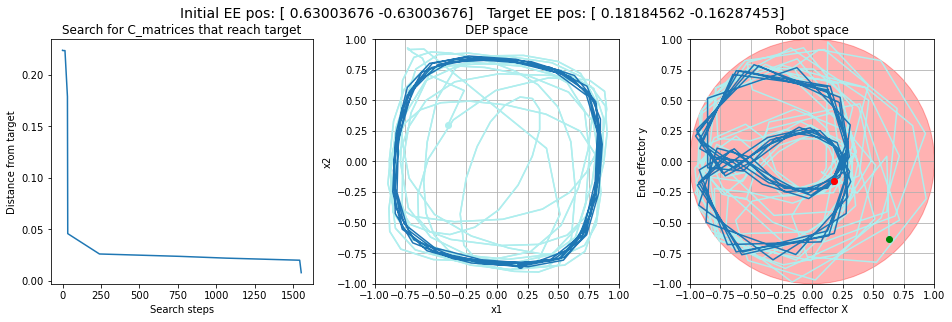

Rendering took 59s




[ 0.63003676 -0.63003676]
TEST 23: From EE [ 0.63003676 -0.63003676] to [-0.16850247 -0.24462343]
X1,X2: [-0.4, 0.3] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-1.096  0.808]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-1.         -0.14285714 -0.71428571 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -0.14285714 -0.71428571 -0.14285714], found in 203 search steps, which reached distance 0.006 in 7 timesteps.
Took 268s


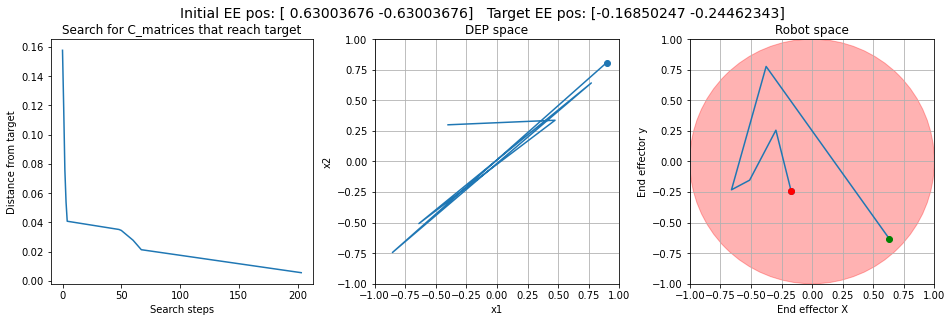

Rendering took 0s




[ 0.63003676 -0.63003676]
TEST 24: From EE [ 0.63003676 -0.63003676] to [0.5040396 0.2948911]
X1,X2: [-0.4, 0.3] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.133  0.603]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-0.71428571 -0.42857143  0.71428571 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.42857143  0.71428571 -0.42857143], found in 690 search steps, which reached distance 0.007 in 24 timesteps.
Took 911s


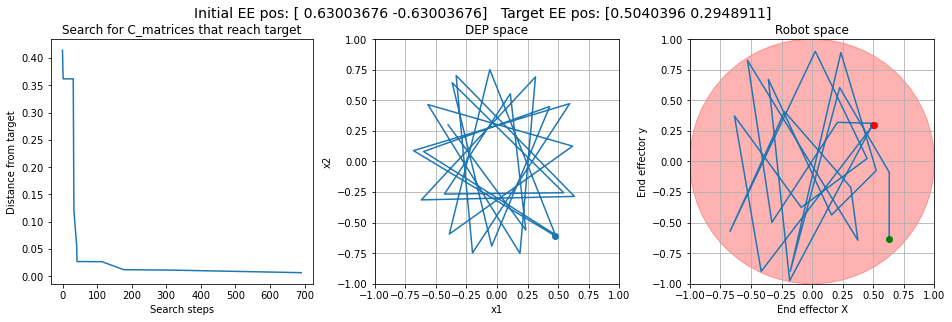

Rendering took 2s




[ 0.63003676 -0.63003676]
TEST 25: From EE [ 0.63003676 -0.63003676] to [-0.51590981  0.65867415]
X1,X2: [-0.4, 0.3] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-0.4  0.3] [0.527 0.369]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-0.71428571  0.71428571 -0.14285714 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.71428571  0.71428571 -0.14285714 -0.42857143], found in 922 search steps, which reached distance 0.008 in 16 timesteps.
Took 1218s


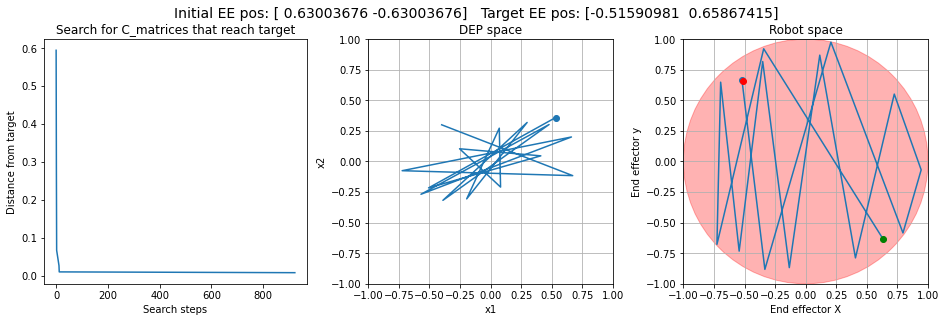

Rendering took 1s




[ 0.63003676 -0.63003676]
TEST 26: From EE [ 0.63003676 -0.63003676] to [-0.0234719  -0.99599384]
X1,X2: [-0.4, 0.3] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.535  0.055]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-1.          0.71428571 -1.         -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.          0.71428571 -1.         -0.14285714], found in 387 search steps, which reached distance 0.006 in 24 timesteps.
Took 513s


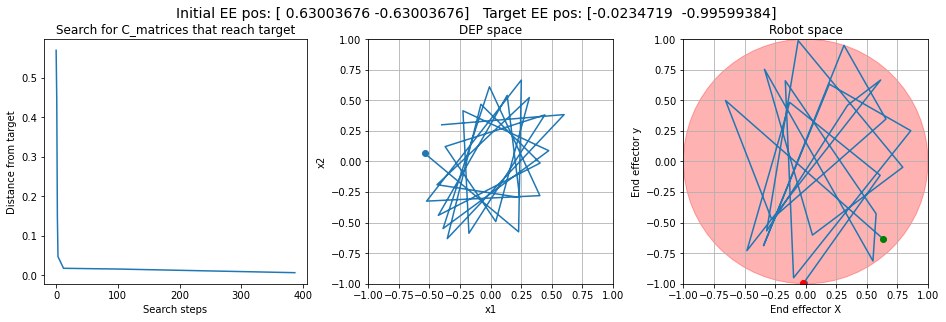

Rendering took 2s




[ 0.63003676 -0.63003676]
TEST 27: From EE [ 0.63003676 -0.63003676] to [0.06133806 0.31351151]
X1,X2: [-0.4, 0.3] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-0.4  0.3] [0.042 0.793]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-0.71428571 -0.42857143 -1.          1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.42857143 -1.          1.        ], found in 647 search steps, which reached distance 0.010 in 7 timesteps.
Took 849s


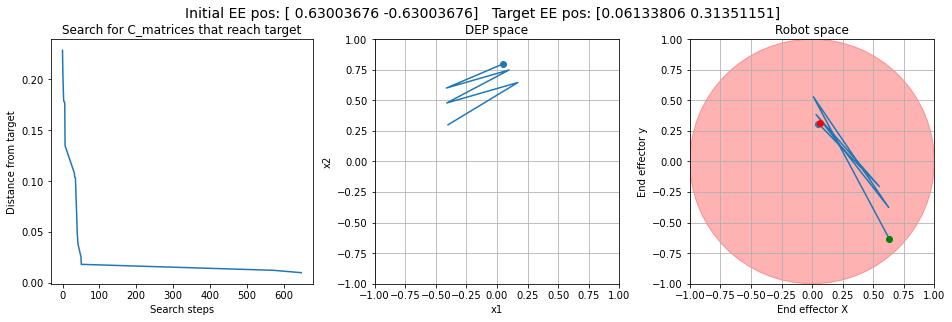

Rendering took 1s




[ 0.63003676 -0.63003676]
TEST 28: From EE [ 0.63003676 -0.63003676] to [0.08924421 0.11103709]
X1,X2: [-0.4, 0.3] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.17   0.909]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-1.          1.         -0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.          1.         -0.42857143 -0.71428571], found in 465 search steps, which reached distance 0.007 in 169 timesteps.
Took 620s


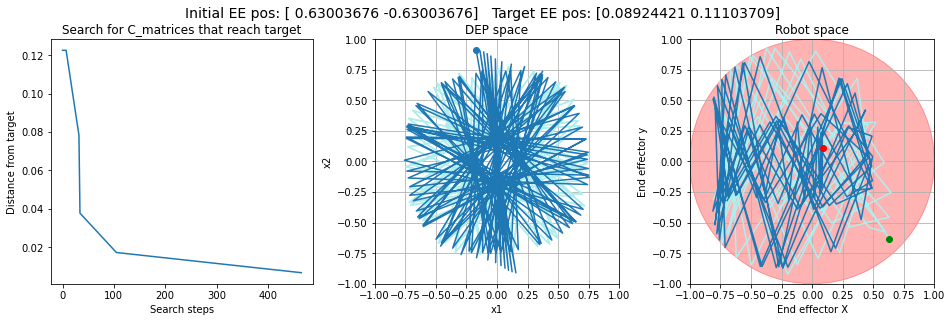

Rendering took 18s




[ 0.63003676 -0.63003676]
TEST 29: From EE [ 0.63003676 -0.63003676] to [-0.2800086  -0.91529548]
X1,X2: [-0.4, 0.3] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-0.4  0.3] [-0.688  0.187]
Searching for c_matrix. Initial EE: [ 0.63003676 -0.63003676]
C=[-1.          0.71428571 -0.42857143  0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.          0.71428571 -0.42857143  0.42857143], found in 405 search steps, which reached distance 0.006 in 8 timesteps.
Took 532s


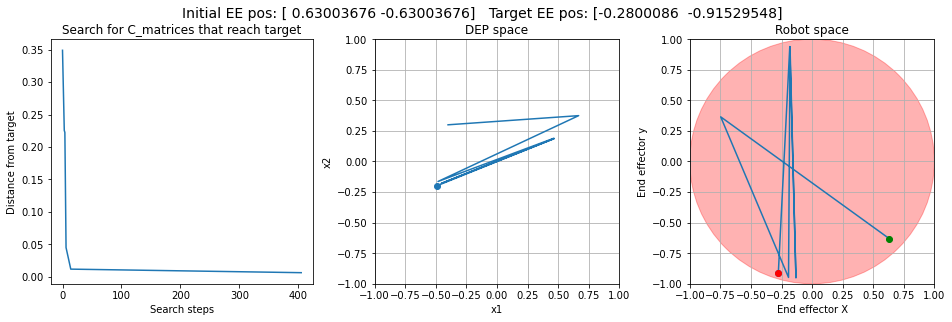

Rendering took 0s




[ 0.14029078 -0.27533616]
TEST 30: From EE [ 0.14029078 -0.27533616] to [ 0.03978996 -0.05835178]
X1,X2: [-0.75, 0.8] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.787  0.955]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.         -0.71428571  0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.         -0.71428571  0.71428571 -1.        ], found in 112 search steps, which reached distance 0.001 in 162 timesteps.
Took 146s


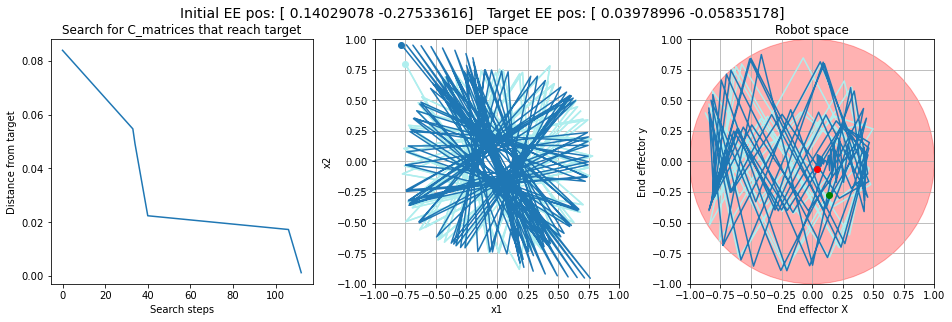

Rendering took 17s




[ 0.14029078 -0.27533616]
TEST 31: From EE [ 0.14029078 -0.27533616] to [ 0.59520723 -0.09618933]
X1,X2: [-0.75, 0.8] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.345  0.588]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.          0.42857143 -0.71428571 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.          0.42857143 -0.71428571 -0.71428571], found in 329 search steps, which reached distance 0.008 in 18 timesteps.
Took 436s


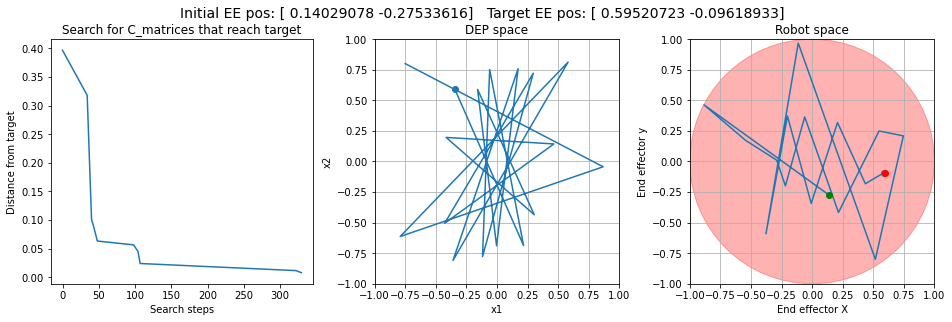

Rendering took 1s




[ 0.14029078 -0.27533616]
TEST 32: From EE [ 0.14029078 -0.27533616] to [ 0.18184562 -0.16287453]
X1,X2: [-0.75, 0.8] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.654  0.843]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.         -0.71428571  0.42857143 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.         -0.71428571  0.42857143 -1.        ], found in 104 search steps, which reached distance 0.004 in 3 timesteps.
Took 160s


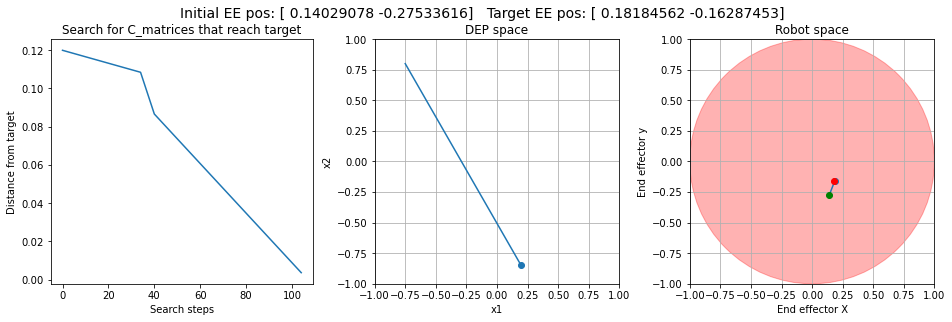

Rendering took 0s




[ 0.14029078 -0.27533616]
TEST 33: From EE [ 0.14029078 -0.27533616] to [-0.16850247 -0.24462343]
X1,X2: [-0.75, 0.8] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-1.096  0.808]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.          0.14285714 -0.71428571  0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.          0.14285714 -0.71428571  0.14285714], found in 268 search steps, which reached distance 0.007 in 9 timesteps.
Took 444s


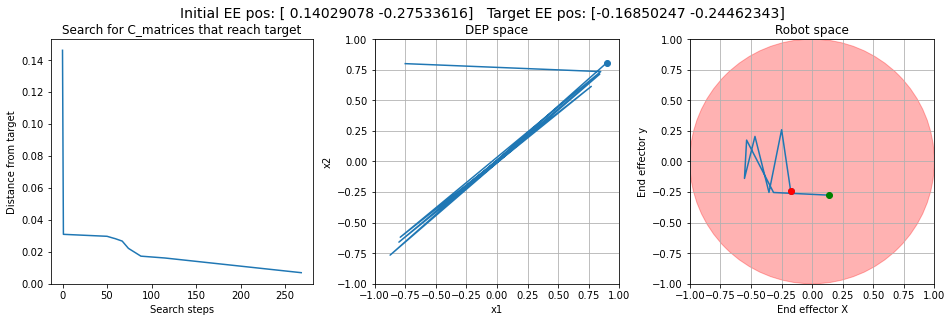

Rendering took 1s




[ 0.14029078 -0.27533616]
TEST 34: From EE [ 0.14029078 -0.27533616] to [0.5040396 0.2948911]
X1,X2: [-0.75, 0.8] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.133  0.603]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-0.71428571 -0.42857143  0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.42857143  0.71428571 -1.        ], found in 688 search steps, which reached distance 0.004 in 33 timesteps.
Took 1114s


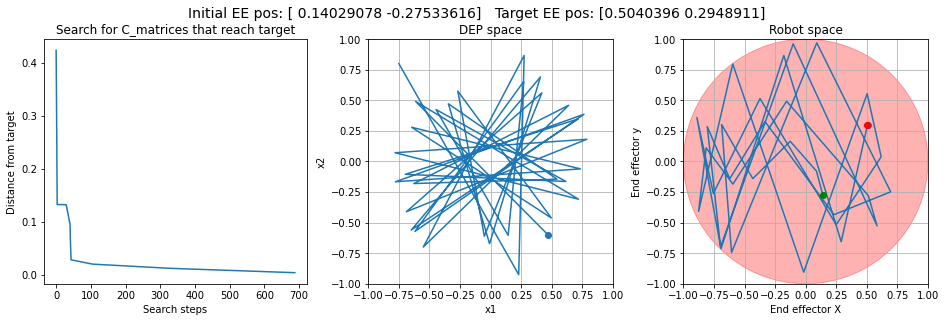

Rendering took 4s




[ 0.14029078 -0.27533616]
TEST 35: From EE [ 0.14029078 -0.27533616] to [-0.51590981  0.65867415]
X1,X2: [-0.75, 0.8] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [0.527 0.369]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-0.14285714 -0.71428571 -0.71428571  0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.14285714 -0.71428571 -0.71428571  0.71428571], found in 1614 search steps, which reached distance 0.003 in 271 timesteps.
Took 2651s


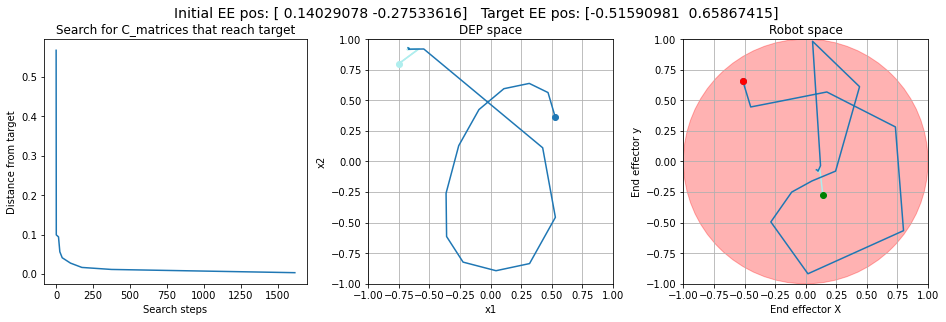

Rendering took 34s




[ 0.14029078 -0.27533616]
TEST 36: From EE [ 0.14029078 -0.27533616] to [-0.0234719  -0.99599384]
X1,X2: [-0.75, 0.8] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.535  0.055]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.         -1.         -0.14285714  0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -1.         -0.14285714  0.42857143], found in 29 search steps, which reached distance 0.006 in 6 timesteps.
Took 48s


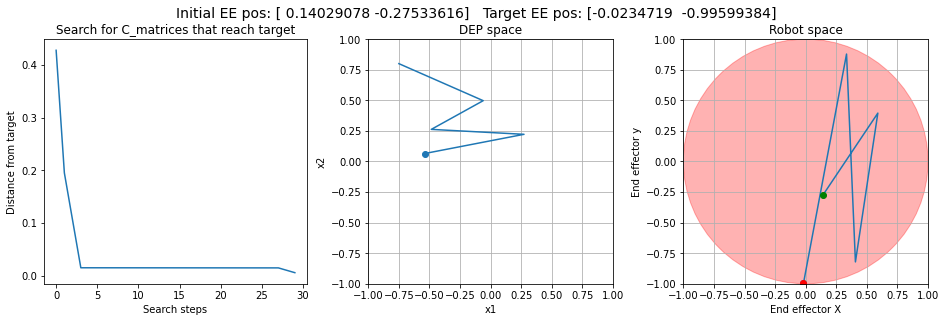

Rendering took 0s




[ 0.14029078 -0.27533616]
TEST 37: From EE [ 0.14029078 -0.27533616] to [0.06133806 0.31351151]
X1,X2: [-0.75, 0.8] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [0.042 0.793]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-0.42857143 -0.71428571  1.         -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.42857143 -0.71428571  1.         -0.42857143], found in 1146 search steps, which reached distance 0.006 in 11 timesteps.
Took 1995s


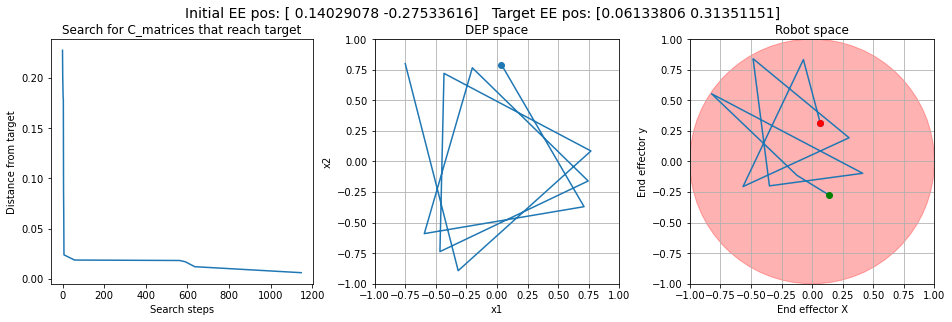

Rendering took 1s




[ 0.14029078 -0.27533616]
TEST 38: From EE [ 0.14029078 -0.27533616] to [0.08924421 0.11103709]
X1,X2: [-0.75, 0.8] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.17   0.909]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.          0.14285714  0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.          0.14285714  0.71428571 -1.        ], found in 304 search steps, which reached distance 0.007 in 3 timesteps.
Took 492s


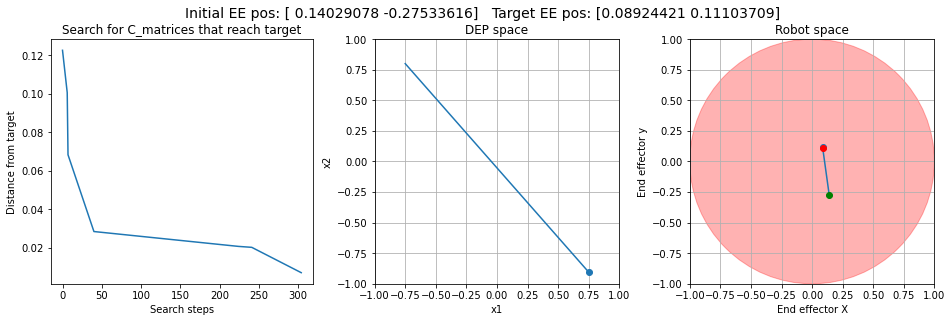

Rendering took 0s




[ 0.14029078 -0.27533616]
TEST 39: From EE [ 0.14029078 -0.27533616] to [-0.2800086  -0.91529548]
X1,X2: [-0.75, 0.8] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-0.75  0.8 ] [-0.688  0.187]
Searching for c_matrix. Initial EE: [ 0.14029078 -0.27533616]
C=[-1.         -1.          0.42857143 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -0.42857143], found in 42 search steps, which reached distance 0.008 in 41 timesteps.
Took 68s


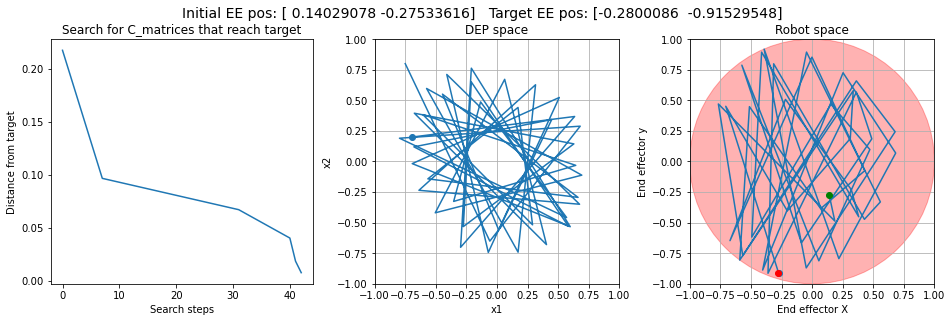

Rendering took 5s




[0.33074062 0.41818969]
TEST 40: From EE [0.33074062 0.41818969] to [ 0.03978996 -0.05835178]
X1,X2: [-0.034, 0.642] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.787  0.955]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.         -0.71428571  0.42857143 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -0.71428571  0.42857143 -0.14285714], found in 107 search steps, which reached distance 0.007 in 120 timesteps.
Took 174s


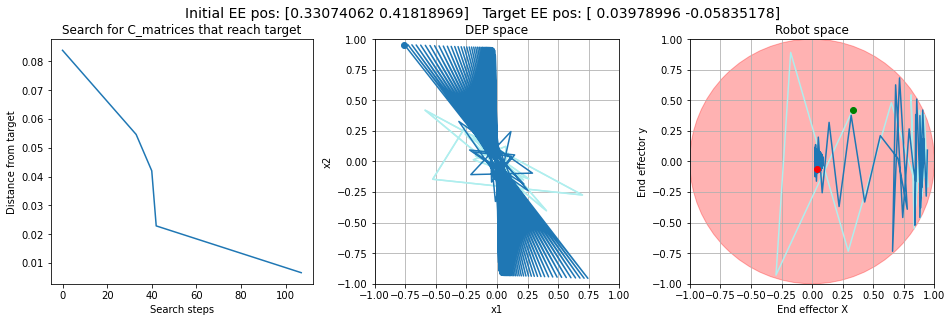

Rendering took 15s




[0.33074062 0.41818969]
TEST 41: From EE [0.33074062 0.41818969] to [ 0.59520723 -0.09618933]
X1,X2: [-0.034, 0.642] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.345  0.588]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.         -0.42857143  0.71428571 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.71428571 -0.42857143], found in 178 search steps, which reached distance 0.005 in 26 timesteps.
Took 285s


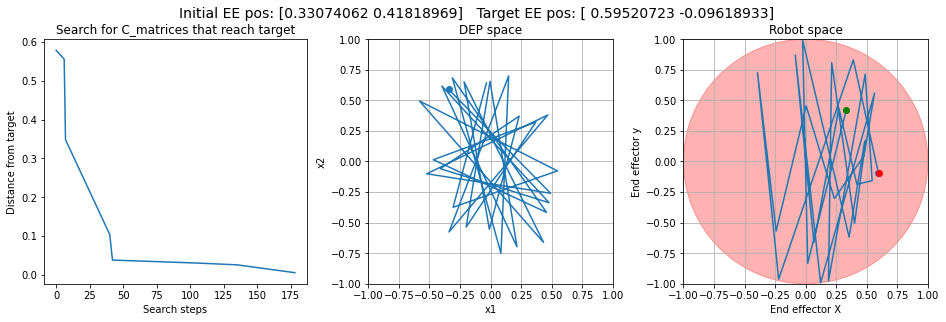

Rendering took 3s




[0.33074062 0.41818969]
TEST 42: From EE [0.33074062 0.41818969] to [ 0.18184562 -0.16287453]
X1,X2: [-0.034, 0.642] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.654  0.843]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-0.42857143  0.14285714 -0.14285714 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.42857143  0.14285714 -0.14285714 -0.71428571], found in 1305 search steps, which reached distance 0.009 in 6 timesteps.
Took 1787s


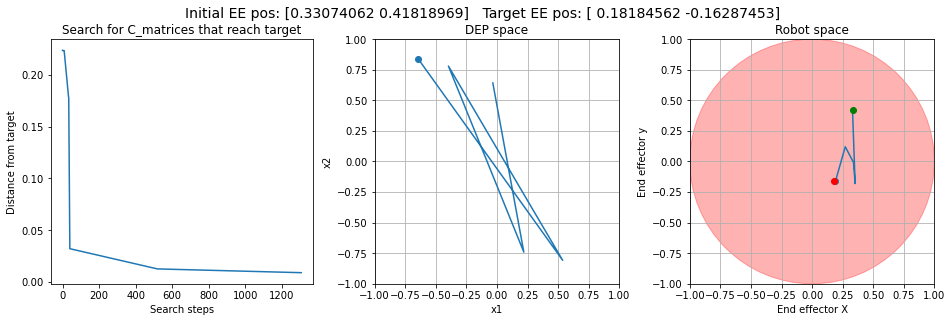

Rendering took 0s




[0.33074062 0.41818969]
TEST 43: From EE [0.33074062 0.41818969] to [-0.16850247 -0.24462343]
X1,X2: [-0.034, 0.642] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-1.096  0.808]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-0.71428571 -0.14285714 -0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.14285714 -0.71428571 -1.        ], found in 712 search steps, which reached distance 0.009 in 5 timesteps.
Took 908s


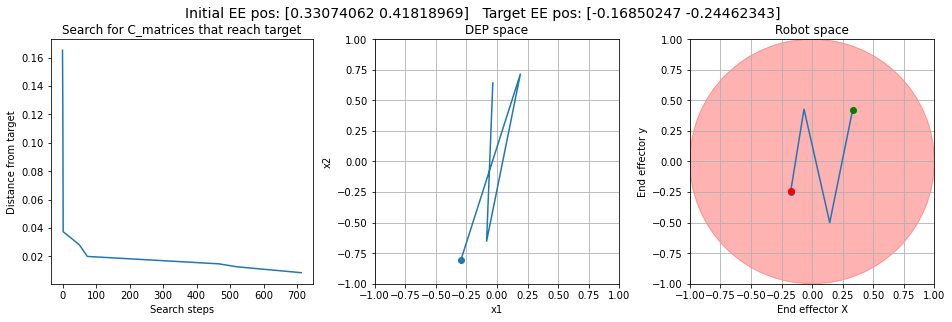

Rendering took 0s




[0.33074062 0.41818969]
TEST 44: From EE [0.33074062 0.41818969] to [0.5040396 0.2948911]
X1,X2: [-0.034, 0.642] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.133  0.603]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.         -1.          0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -0.71428571], found in 41 search steps, which reached distance 0.009 in 57 timesteps.
Took 51s


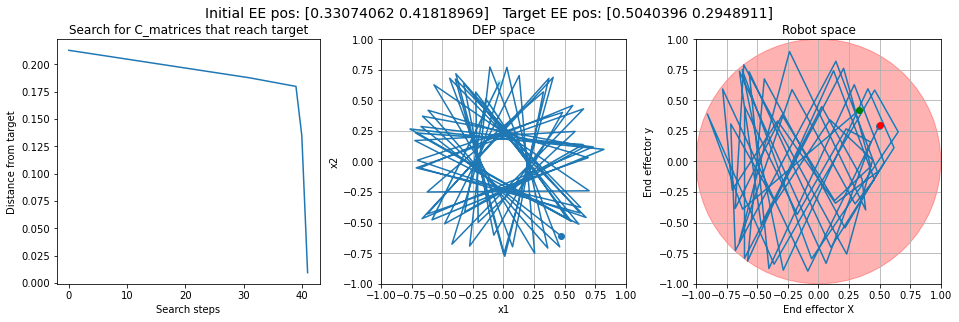

Rendering took 5s




[0.33074062 0.41818969]
TEST 45: From EE [0.33074062 0.41818969] to [-0.51590981  0.65867415]
X1,X2: [-0.034, 0.642] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-0.034  0.642] [0.527 0.369]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-0.71428571 -0.71428571  0.14285714  0.14285714] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.71428571  0.14285714  0.14285714], found in 612 search steps, which reached distance 0.010 in 16 timesteps.
Took 909s


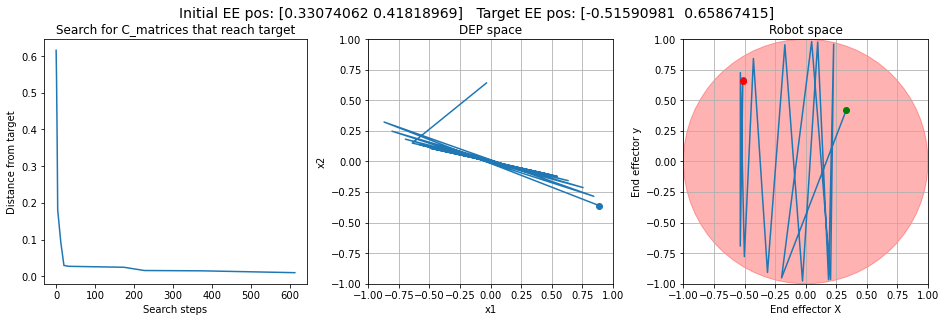

Rendering took 1s




[0.33074062 0.41818969]
TEST 46: From EE [0.33074062 0.41818969] to [-0.0234719  -0.99599384]
X1,X2: [-0.034, 0.642] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.535  0.055]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.         -1.          0.14285714  0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.14285714  0.14285714], found in 36 search steps, which reached distance 0.006 in 5 timesteps.
Took 50s


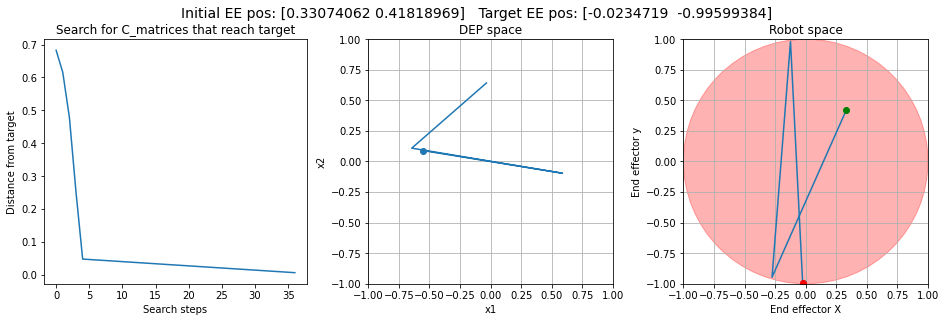

Rendering took 0s




[0.33074062 0.41818969]
TEST 47: From EE [0.33074062 0.41818969] to [0.06133806 0.31351151]
X1,X2: [-0.034, 0.642] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-0.034  0.642] [0.042 0.793]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.          1.         -0.42857143 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.          1.         -0.42857143 -0.42857143], found in 466 search steps, which reached distance 0.010 in 170 timesteps.
Took 685s


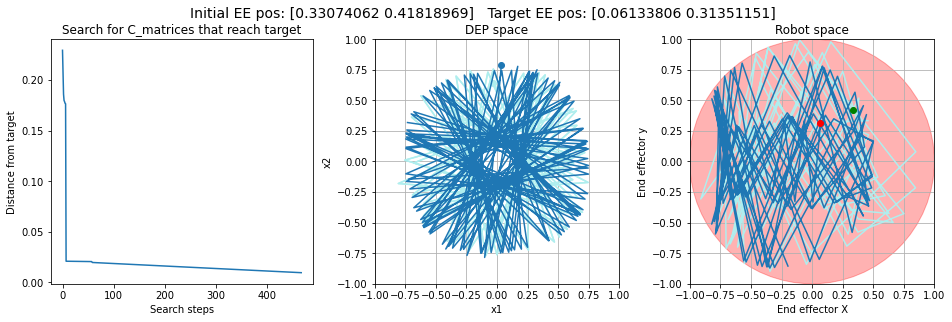

Rendering took 22s




[0.33074062 0.41818969]
TEST 48: From EE [0.33074062 0.41818969] to [0.08924421 0.11103709]
X1,X2: [-0.034, 0.642] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.17   0.909]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-0.71428571  0.14285714  1.         -0.42857143] reached target!
SUCCESS!!!
Best solution was [-0.71428571  0.14285714  1.         -0.42857143], found in 826 search steps, which reached distance 0.010 in 9 timesteps.
Took 1203s


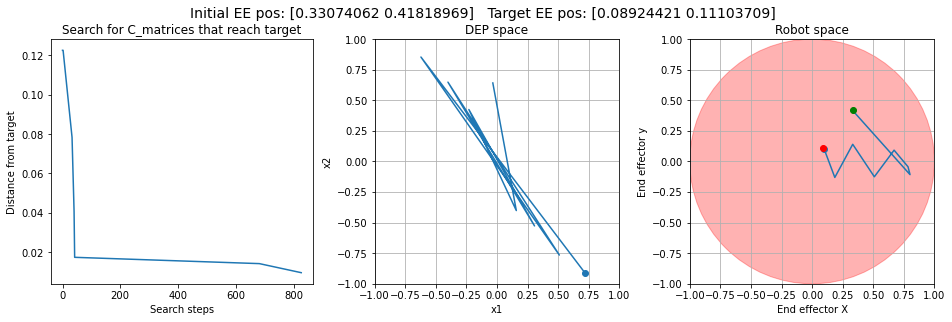

Rendering took 1s




[0.33074062 0.41818969]
TEST 49: From EE [0.33074062 0.41818969] to [-0.2800086  -0.91529548]
X1,X2: [-0.034, 0.642] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-0.034  0.642] [-0.688  0.187]
Searching for c_matrix. Initial EE: [0.33074062 0.41818969]
C=[-1.         -0.42857143  0.71428571 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.71428571 -0.42857143], found in 178 search steps, which reached distance 0.008 in 42 timesteps.
Took 262s


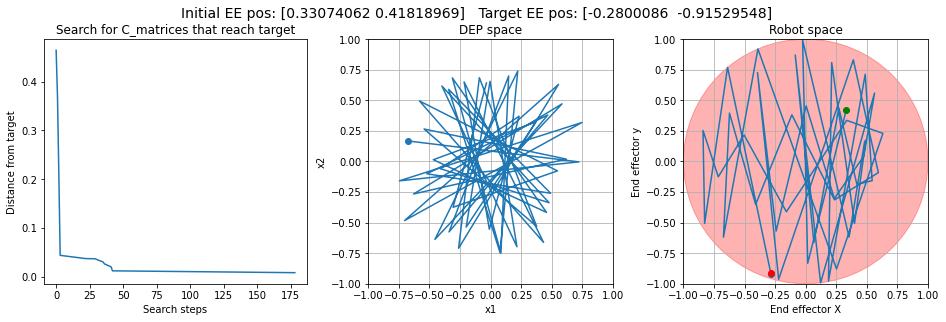

Rendering took 5s




[0.77017569 0.14316078]
TEST 50: From EE [0.77017569 0.14316078] to [ 0.03978996 -0.05835178]
X1,X2: [0.272, -0.427] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.787  0.955]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-1.         -0.42857143  0.42857143 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.42857143 -0.42857143], found in 170 search steps, which reached distance 0.010 in 21 timesteps.
Took 255s


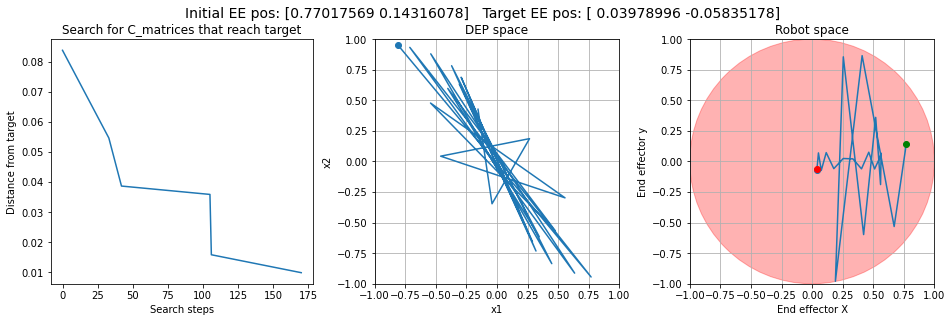

Rendering took 2s




[0.77017569 0.14316078]
TEST 51: From EE [0.77017569 0.14316078] to [ 0.59520723 -0.09618933]
X1,X2: [0.272, -0.427] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.345  0.588]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.71428571 -1.          1.          0.14285714] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -1.          1.          0.14285714], found in 572 search steps, which reached distance 0.005 in 19 timesteps.
Took 851s


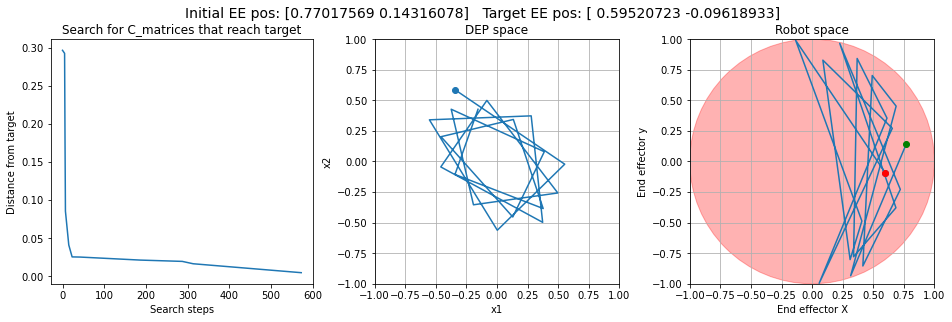

Rendering took 2s




[0.77017569 0.14316078]
TEST 52: From EE [0.77017569 0.14316078] to [ 0.18184562 -0.16287453]
X1,X2: [0.272, -0.427] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.654  0.843]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.42857143  0.42857143 -0.14285714  0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.42857143  0.42857143 -0.14285714  0.71428571], found in 1374 search steps, which reached distance 0.007 in 638 timesteps.
Took 2068s


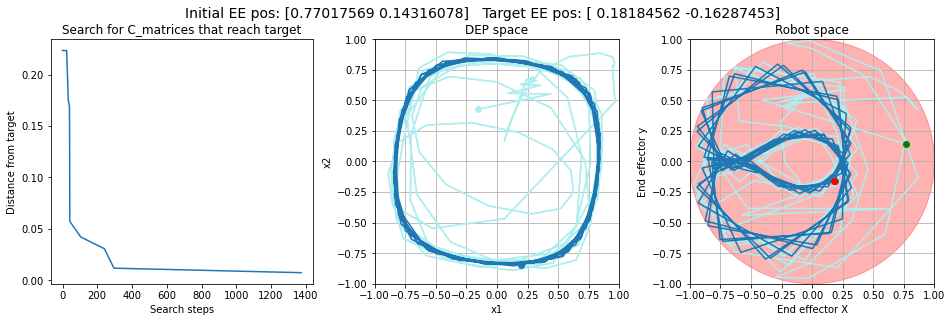

Rendering took 70s




[0.77017569 0.14316078]
TEST 53: From EE [0.77017569 0.14316078] to [-0.16850247 -0.24462343]
X1,X2: [0.272, -0.427] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-1.096  0.808]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.71428571 -0.42857143  0.42857143 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.42857143  0.42857143 -0.71428571], found in 681 search steps, which reached distance 0.008 in 73 timesteps.
Took 1407s


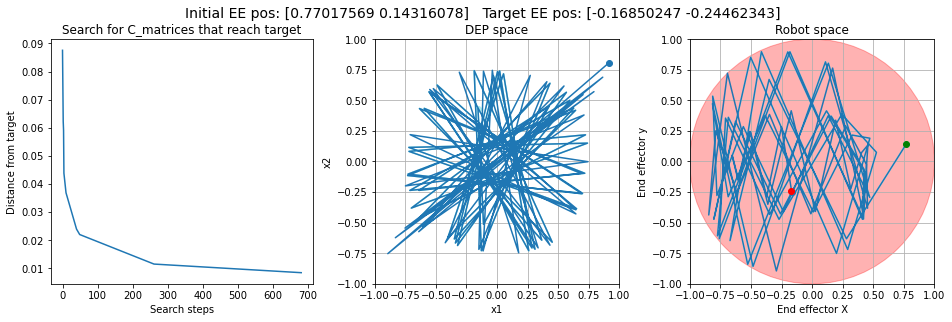

Rendering took 19s




[0.77017569 0.14316078]
TEST 54: From EE [0.77017569 0.14316078] to [0.5040396 0.2948911]
X1,X2: [0.272, -0.427] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.133  0.603]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.71428571  0.14285714 -0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571  0.14285714 -0.71428571 -1.        ], found in 776 search steps, which reached distance 0.004 in 14 timesteps.
Took 2293s


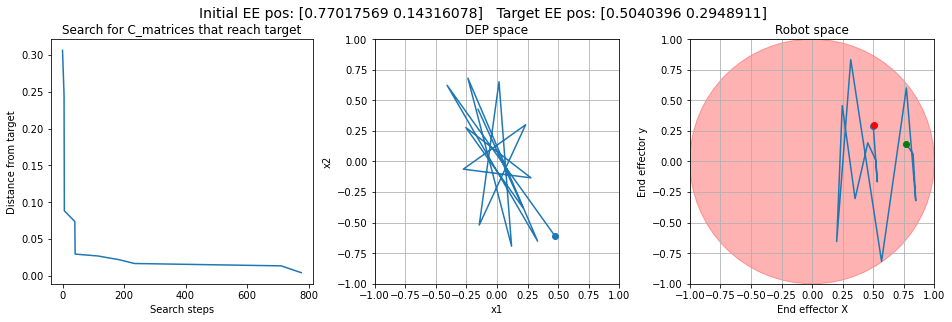

Rendering took 2s




[0.77017569 0.14316078]
TEST 55: From EE [0.77017569 0.14316078] to [-0.51590981  0.65867415]
X1,X2: [0.272, -0.427] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [-0.155  0.427] [0.527 0.369]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.71428571 -0.14285714  1.          1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.14285714  1.          1.        ], found in 767 search steps, which reached distance 0.007 in 276 timesteps.
Took 1061s


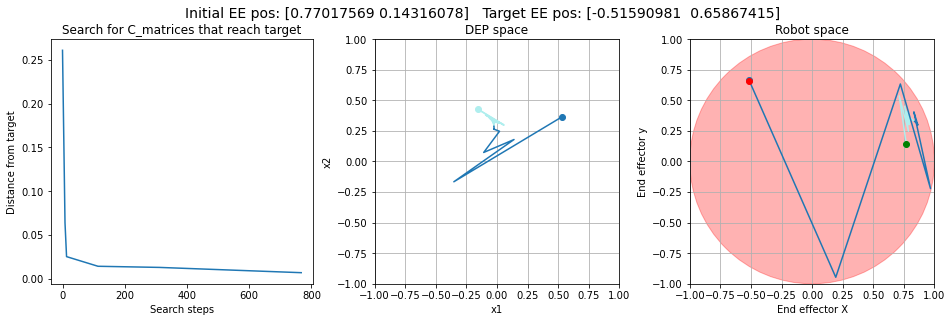

Rendering took 27s




[0.77017569 0.14316078]
TEST 56: From EE [0.77017569 0.14316078] to [-0.0234719  -0.99599384]
X1,X2: [0.272, -0.427] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.535  0.055]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-1.         -0.42857143  0.14285714 -0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.14285714 -0.42857143], found in 162 search steps, which reached distance 0.005 in 5 timesteps.
Took 206s


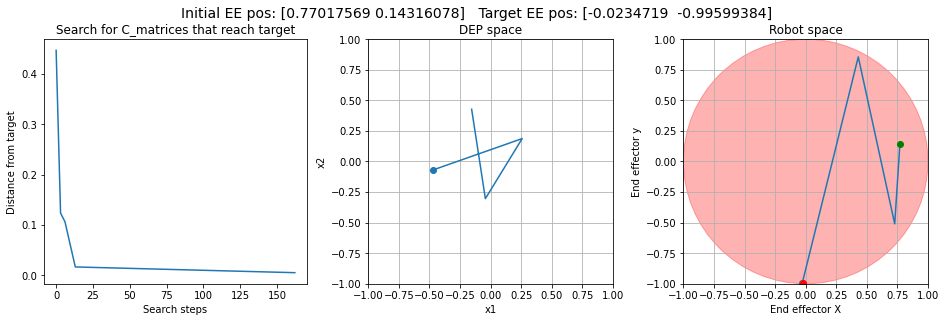

Rendering took 0s




[0.77017569 0.14316078]
TEST 57: From EE [0.77017569 0.14316078] to [0.06133806 0.31351151]
X1,X2: [0.272, -0.427] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [-0.155  0.427] [0.042 0.793]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-0.71428571 -0.14285714  0.14285714  1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571 -0.14285714  0.14285714  1.        ], found in 743 search steps, which reached distance 0.004 in 7 timesteps.
Took 949s


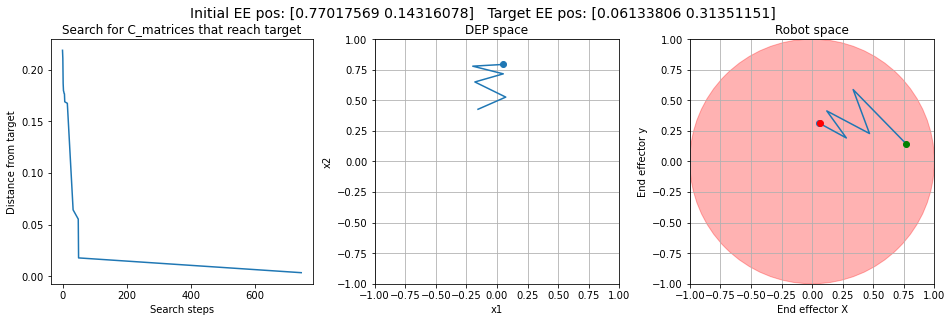

Rendering took 0s




[0.77017569 0.14316078]
TEST 58: From EE [0.77017569 0.14316078] to [0.08924421 0.11103709]
X1,X2: [0.272, -0.427] to [-0.17, 0.909]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.17   0.909]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-1.         -0.42857143  0.71428571 -0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -0.42857143  0.71428571 -0.71428571], found in 177 search steps, which reached distance 0.004 in 82 timesteps.
Took 231s


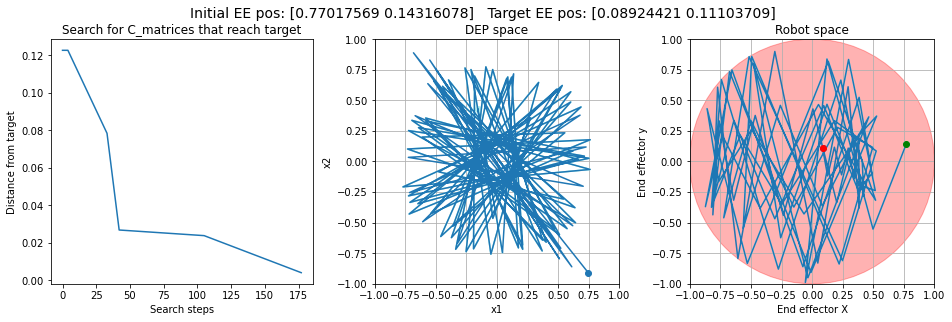

Rendering took 8s




[0.77017569 0.14316078]
TEST 59: From EE [0.77017569 0.14316078] to [-0.2800086  -0.91529548]
X1,X2: [0.272, -0.427] to [-0.688, 0.187]
Back-check. ee_to_dep(EE): [-0.155  0.427] [-0.688  0.187]
Searching for c_matrix. Initial EE: [0.77017569 0.14316078]
C=[-1.          0.42857143 -0.71428571  1.        ] reached target!
SUCCESS!!!
Best solution was [-1.          0.42857143 -0.71428571  1.        ], found in 335 search steps, which reached distance 0.007 in 30 timesteps.
Took 428s


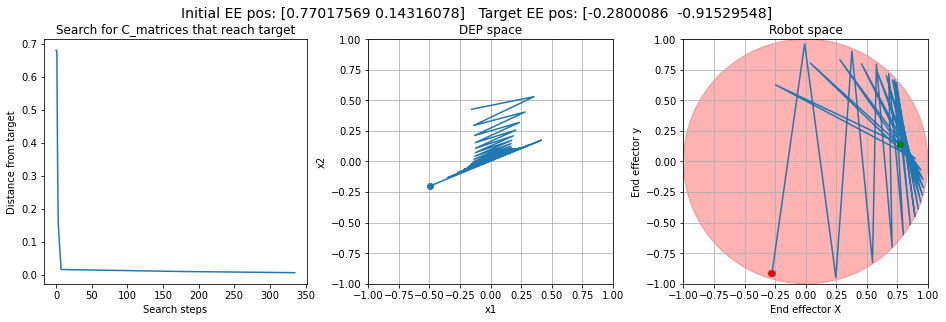

Rendering took 3s




[0.71890586 0.67936028]
TEST 60: From EE [0.71890586 0.67936028] to [ 0.03978996 -0.05835178]
X1,X2: [0.288, -0.094] to [-0.787, 0.955]
Back-check. ee_to_dep(EE): [0.194 0.094] [-0.787  0.955]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-1.         -1.          0.71428571 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.71428571 -1.        ], found in 48 search steps, which reached distance 0.008 in 271 timesteps.
Took 61s


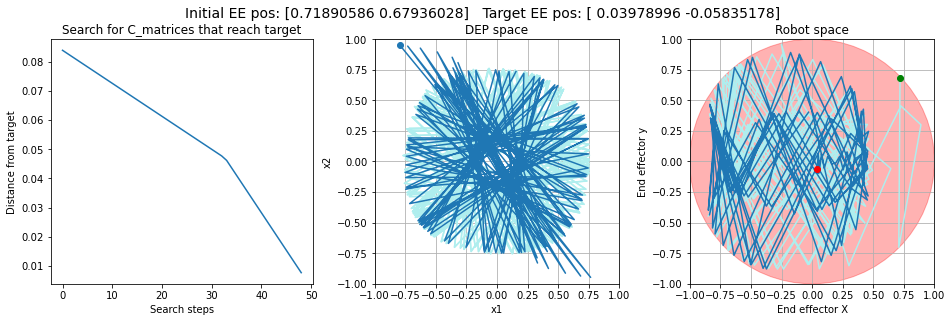

Rendering took 29s




[0.71890586 0.67936028]
TEST 61: From EE [0.71890586 0.67936028] to [ 0.59520723 -0.09618933]
X1,X2: [0.288, -0.094] to [0.243, -0.588]
Back-check. ee_to_dep(EE): [0.194 0.094] [-0.345  0.588]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[ 0.42857143 -0.14285714  0.42857143  1.        ] reached target!
SUCCESS!!!
Best solution was [ 0.42857143 -0.14285714  0.42857143  1.        ], found in 2799 search steps, which reached distance 0.006 in 19 timesteps.
Took 4452s


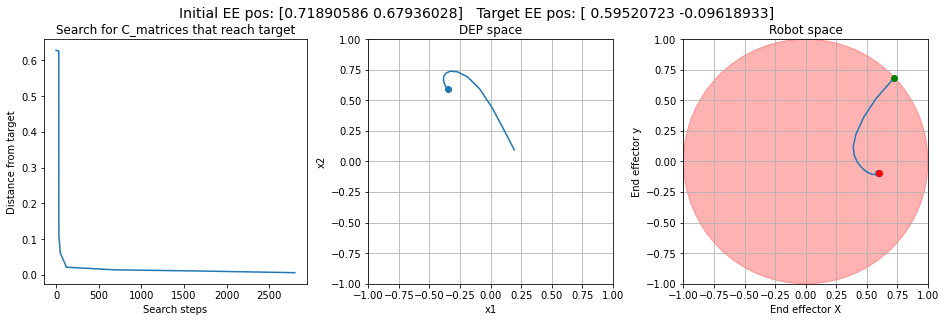

Rendering took 2s




[0.71890586 0.67936028]
TEST 62: From EE [0.71890586 0.67936028] to [ 0.18184562 -0.16287453]
X1,X2: [0.288, -0.094] to [0.189, -0.843]
Back-check. ee_to_dep(EE): [0.194 0.094] [-0.654  0.843]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-0.71428571  0.71428571  0.14285714  1.        ] reached target!
SUCCESS!!!
Best solution was [-0.71428571  0.71428571  0.14285714  1.        ], found in 935 search steps, which reached distance 0.010 in 247 timesteps.
Took 1478s


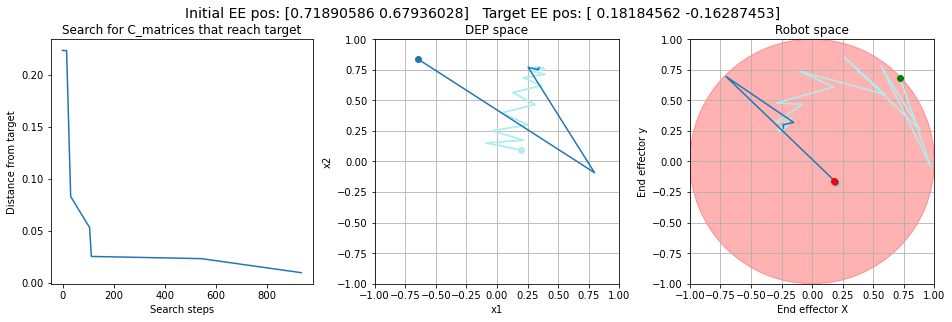

Rendering took 31s




[0.71890586 0.67936028]
TEST 63: From EE [0.71890586 0.67936028] to [-0.16850247 -0.24462343]
X1,X2: [0.288, -0.094] to [0.904, 0.808]
Back-check. ee_to_dep(EE): [0.194 0.094] [-1.096  0.808]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-1.         -0.14285714 -0.71428571 -0.14285714] reached target!
SUCCESS!!!
Best solution was [-1.         -0.14285714 -0.71428571 -0.14285714], found in 203 search steps, which reached distance 0.010 in 8 timesteps.
Took 306s


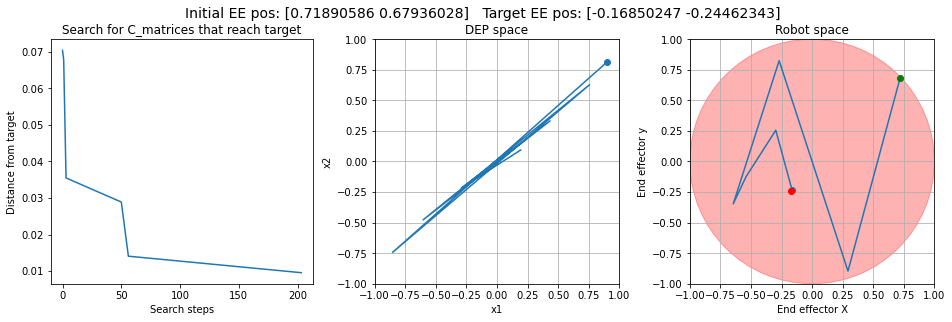

Rendering took 1s




[0.71890586 0.67936028]
TEST 64: From EE [0.71890586 0.67936028] to [0.5040396 0.2948911]
X1,X2: [0.288, -0.094] to [0.47, -0.603]
Back-check. ee_to_dep(EE): [0.194 0.094] [-0.133  0.603]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-1.         -1.          0.42857143 -1.        ] reached target!
SUCCESS!!!
Best solution was [-1.         -1.          0.42857143 -1.        ], found in 40 search steps, which reached distance 0.008 in 17 timesteps.
Took 60s


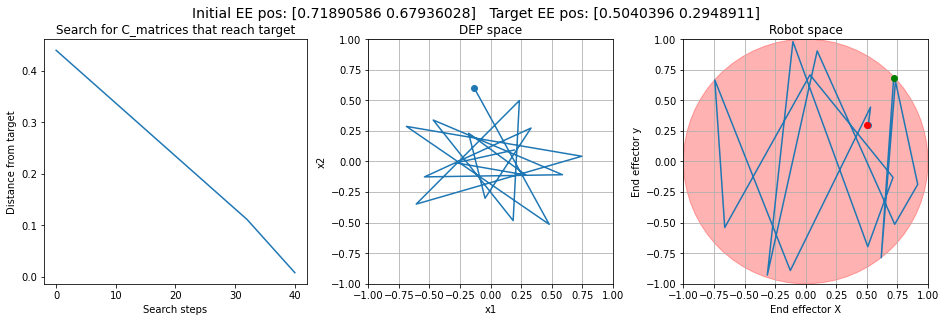

Rendering took 1s




[0.71890586 0.67936028]
TEST 65: From EE [0.71890586 0.67936028] to [-0.51590981  0.65867415]
X1,X2: [0.288, -0.094] to [0.527, 0.369]
Back-check. ee_to_dep(EE): [0.194 0.094] [0.527 0.369]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-1.          0.14285714  0.42857143  0.42857143] reached target!
SUCCESS!!!
Best solution was [-1.          0.14285714  0.42857143  0.42857143], found in 301 search steps, which reached distance 0.009 in 8 timesteps.
Took 528s


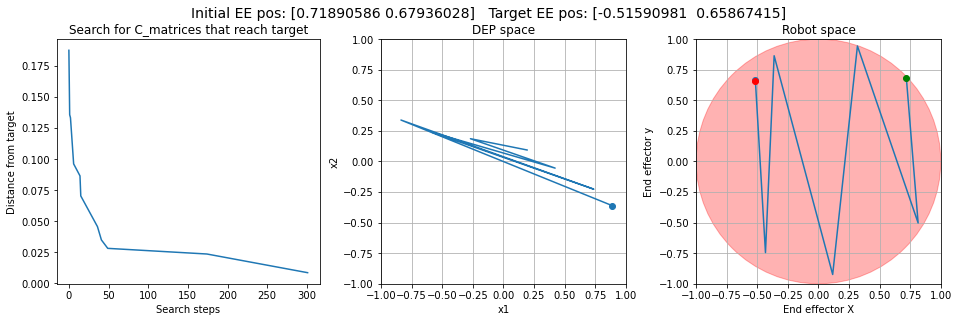

Rendering took 1s




[0.71890586 0.67936028]
TEST 66: From EE [0.71890586 0.67936028] to [-0.0234719  -0.99599384]
X1,X2: [0.288, -0.094] to [-0.535, 0.055]
Back-check. ee_to_dep(EE): [0.194 0.094] [-0.535  0.055]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]
C=[-1.         -1.         -0.42857143  0.71428571] reached target!
SUCCESS!!!
Best solution was [-1.         -1.         -0.42857143  0.71428571], found in 22 search steps, which reached distance 0.004 in 5 timesteps.
Took 33s


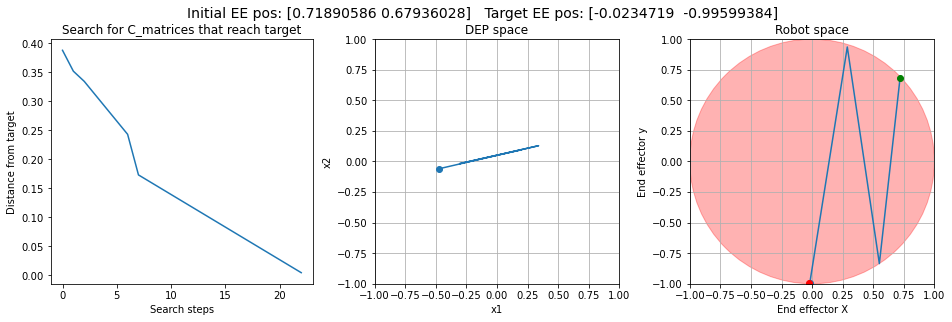

Rendering took 0s




[0.71890586 0.67936028]
TEST 67: From EE [0.71890586 0.67936028] to [0.06133806 0.31351151]
X1,X2: [0.288, -0.094] to [0.042, 0.793]
Back-check. ee_to_dep(EE): [0.194 0.094] [0.042 0.793]
Searching for c_matrix. Initial EE: [0.71890586 0.67936028]


KeyboardInterrupt: 

In [16]:
initial_xs = [[-0.6, -0.1], [0.7, 0.9], [-0.4, 0.3], [-0.75, 0.8], [-0.034, 0.642], [0.272, -0.427], [0.288, -0.094], [0.017, 0.327], [0.913, 0.694], [-0.287, 0.494]]
target_xs = [[-0.787, 0.955], [0.243, -0.588], [0.189, -0.843], [0.904, 0.808], [0.47, -0.603], [0.527, 0.369], [-0.535, 0.055], [0.042, 0.793], [-0.17, 0.909], [-0.688, 0.187]]
NUMBER_TEST_DIMENSIONS = len(initial_xs)

results = []
expt_start = time.time()
absolutely_all_n_distances = []
for test_i in range(NUMBER_TEST_DIMENSIONS):
    initial_x = initial_xs[test_i]
    initial_ee = dep_to_ee(initial_x)
    for test_j in range(NUMBER_TEST_DIMENSIONS):
        target_x = target_xs[test_j]
        target_ee = dep_to_ee(target_x)
        print("\n\n========================")
        print(initial_ee)
        print("TEST %d: From EE %s to %s"%(test_i*NUMBER_TEST_DIMENSIONS+test_j, str(initial_ee), str(target_ee)))
        print("X1,X2: %s to %s" %(str(initial_x), str(target_x)))
        print("Back-check. ee_to_dep(EE):", ee_to_dep(initial_ee), ee_to_dep(target_ee))
        print("========================")
        target_reached, n, closest_distance, best_c, all_n_distances = search_for_c_matrix(initial_ee, target_ee)
        results.append([initial_ee, target_ee, target_reached, n, closest_distance, best_c])     
        absolutely_all_n_distances = absolutely_all_n_distances + all_n_distances
total_t = time.time() - expt_start 
print("Experiment took %d minutes" % (total_t//60))
for i, result in enumerate(results):
    success = "SUCCESS" if result[2] else "FAILED"
    print("Test %d: %s -> %s. %s in %d steps. Closest = %.3f" % (i, str(result[0]), str(result[1]), success, result[3], result[4]))           

N= 34183
mean_search_times [1018.27987596  169.99286195   43.55258462   31.55732382   24.62779744]


Text(0.5, 0.98, 'Search Complexity vs Error Tolerance for Reaching Trajectories')

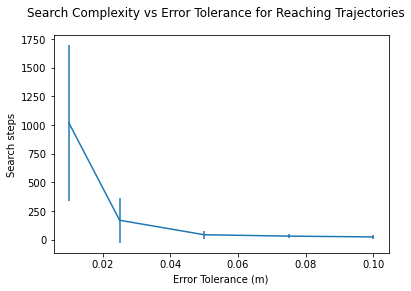

In [19]:
absolutely_all_n_distances = np.array(absolutely_all_n_distances)
print("N=",len(absolutely_all_n_distances))
mean_search_times = np.mean(absolutely_all_n_distances, axis=0)
print("mean_search_times", mean_search_times)
std_search_times = np.std(absolutely_all_n_distances, axis=0)
fig, ax = plt.subplots()
ax.set_xlabel("Error Tolerance (m)")
ax.set_ylabel("Search steps")
ax.errorbar(EPSILONS, mean_search_times, yerr=std_search_times)
fig.suptitle("Search Complexity vs Error Tolerance for Reaching Trajectories")

In [ ]:
foo

In [ ]:
initial_c_matrices = [[[0,0],[0,0]], [[1,0],[0,1]], [[0,1],[1,0]], [[1,1],[1,1]]]
all_x_for_x_inits = []
for x1, x2 in initial_x:
    print("\n\n\n========================x1 = %.1f, x2 = %.1f =========================" % (x1, x2))
    n = 0
    x1_ns, x2_ns, all_x_for_matrices = [], [], []
    for c in initial_c_matrices:
        c_matrix0 = np.array(c)
        print_initial_values(c_matrix0, x1, x2)
        c_mean, all_c_hat, all_x = rollout_dep(x1, x2, c=c_matrix0)
        all_x = [np.array([[x1],[x2]])] + all_x
        if PLOT_TIMESTEPS:
            plot_trajectory_with_intro(all_x)
        if PLOT_C_HAT_EVOLUTION:
            plot_c_timeseries(all_c_hat)
        if RENDER_ANIMATION:
            html = render_animation(all_x)
        x1_n, x2_n = all_x[-1]
        x1_ns.append(x1_n)
        x2_ns.append(x2_n)
        print("Final x1 = %.3f, x2 = %.3f" % (x1_n, x2_n))
        all_x_for_matrices.append(all_x)
    all_equal = True    
    for x1, x2 in zip(x1_ns, x2_ns):
        all_equal = all_equal and (x1==x1_ns[0] and x2==x2_ns[0])
    if all_equal:
        print("End position for all three runs are EQUAL.")
    else:
        print("End position for all three runs NOT EQUAL.")
    all_x_for_x_inits.append(all_x_for_matrices)    
        
        

In [ ]:
fig, axes = plt.subplots(len(initial_x), len(initial_c_matrices), figsize=(16,12))
fig.suptitle("Varying initial conditions for x1, x2 and C matrix", fontsize=20)
#plt.style.use('seaborn')
#plt.tight_layout()
for i in range(len(initial_x)):
    for j in range(len(initial_c_matrices)):
        ax = axes[i,j]
        ax.set_title("x1 %.1f, x2 %.1f, c %s" % (initial_x[i][0], initial_x[i][1], str(np.array(initial_c_matrices[j]).flatten())))
        all_x = all_x_for_x_inits[i][j]
        subplot_trajectory_with_intro(ax, all_x)
plt.show()
print_other_initial_values()


In [ ]:
x = np.array([-0.6, -0.1])
print("x", x)
ee = dep_to_ee(x)
print("x->EE", ee)
x2 = ee_to_dep(ee)
print("x->EE->x", x2)

In [ ]:
import random

def rand_x():
    return float(int((random.random()*2 - 1)*1000))/1000

xs = []
for i in range(10):
    xs.append([rand_x(),rand_x()])
print(xs)    

In [ ]:
fig, ax = plt.subplots()
ticks = [-1., -.75, -.5, -.25, 0., .25, .5, .75, 1.]
ax.set_xticks(ticks, minor=False)
ax.set_yticks(ticks, minor=False)
ax.xaxis.grid(True, which='major')
ax.yaxis.grid(True, which='major')
ax.set_aspect(1)
plt.show